In [1]:

import os,sys,glob
# Move two levels up work from project level, not location of analysis file
os.chdir('../..')
print(os.getcwd())
import numpy as np
import matplotlib.pyplot as plt
import json
import pandas as pd
import Functions.globalFunctions.ExtracellularField as EcF
import matplotlib as mpl
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
from typing import Literal
from scipy import integrate
import ipympl
import time
import seaborn as sns
from scipy import stats
from scipy import optimize
#import warnings
from Analyses.SDC_singlePulse_singleOpticField.tools import *
from Analyses.SDC_singlePulse_singleOpticField import loader

import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm
#warnings.filterwarnings('error',category=UserWarning)

%matplotlib inline
recollect = False


d:\Users\rschoete\Documents\Optogenetics\OptogeneticExcitability\Code


In [2]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]), labels=col_labels)
    ax.set_yticks(np.arange(data.shape[0]), labels=row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar

def heatmap2(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="",row_colors = None, column_colors = None, **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)
    if row_colors is not None:
        ax_row_cols = ax.inset_axes([-0.01, 0, 0.01, 1])
        ax_row_cols.spines[:].set_visible(False)
    if column_colors is not None:
        ax_column_cols = ax.inset_axes([0,1, 1, 0.01,])
        ax_column_cols.spines[:].set_visible(False)



    # Create colorbar
    if not cbar_kw is False:
        cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
        cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    if column_colors is None:
        ax.set_xticks(np.arange(data.shape[1]), labels=col_labels)
        # Let the horizontal axes labeling appear on top.
        ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    else:
        ax_column_cols.imshow(column_colors,aspect='auto')
        ax_column_cols.set_xticks(np.arange(data.shape[0]), labels=col_labels)
        ax_column_cols.set_xticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_column_cols.set_yticks([])
        ax_column_cols.tick_params(which="minor", bottom=False, left=False)
        ax.set_xticks([])
        # Let the horizontal axes labeling appear on top.
        ax_column_cols.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)
        # Rotate the tick labels and set their alignment.
        plt.setp(ax_column_cols.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    if row_colors is None:
        ax.set_yticks(np.arange(data.shape[0]), labels=row_labels)
        ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    else:
        ax_row_cols.imshow(row_colors,aspect='auto')
        ax_row_cols.set_yticks(np.arange(data.shape[0]), labels=row_labels)
        ax_row_cols.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
        ax_row_cols.set_xticks([])
        ax_row_cols.tick_params(which="minor", bottom=False, left=False)

        ax.set_yticks([])
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.grid(which="minor", color="w", linestyle='-', linewidth=1)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


# loading raw data
stored in master_df

unique_values_columns_master contains all unique values for each column

In [3]:

# Load data
filepath = './Results\SDC\SDC_singlePulse_Ugent470_gray_invivo_multicell'
filename = 'all_data.csv'

# list parameters of interest
cell_init_options = ['phi_0', 'theta_0', 'psi_0',
                        'neurontemplate', 'x_0', 'y_0', 'z_0']
settings_options = ['seed', 'celsius', 'dt']
opsin_options = ['Gmax', 'distribution', 'opsinmech',
                    'distribution_method', 'opsinlocations']
field_options = ['field', 'nPulse']
positional_input = ['x', 'y', 'z', 'phi', 'theta', 'psi']
result = ['amp', 'sR', 'ichr2', 'gchr2', 'dur']
all_columns = result+field_options+opsin_options + positional_input + \
    cell_init_options+settings_options


# opsinlocations to single word
opsinLocation_map = loader.opsinLocation_map
master_df = loader.load_data_df(filepath = filepath, filename = filename, recollect = recollect, result = result, all_columns = all_columns, cell_init_options  = cell_init_options, settings_options  = settings_options, opsin_options = opsin_options, field_options = field_options, positional_input=positional_input, fill_missing_xyzpositions = True, save_recollect = True, savename = None)
master_df['amp'] = master_df['amp']/1000 # convert W/m2 -> mW/mm2
for x in ['x','y','z']:
    for suffix in ['','_0']:
        master_df[x+suffix] = master_df[x+suffix]/1000 #convert um -> mm
master_df['TAC']=-master_df['ichr2']/master_df['dur']
master_df['Gmax'] = np.round(master_df['Gmax'],4)
master_df['theta_0'] = np.round(master_df['theta_0'],2)
for x in ['amp','Gmax','TAC','dur']:
    master_df[x+'_log10'] = np.round(np.log10(master_df[x]),4)
master_df['neurontemplate'] = master_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
all_columns=master_df.columns
unique_values_columns_master = {key: master_df[key].unique() for key in all_columns}
for x in ['amp','Gmax','TAC','dur']:
    unique_values_columns_master[x] = np.sort(unique_values_columns_master[x])
    unique_values_columns_master[x+'_log10'] = np.sort(unique_values_columns_master[x+'_log10'])

for theta in unique_values_columns_master['theta_0']:
    if theta!=0:
        label = 'z'
    else:
        label = 'x'
    master_df.loc[master_df['theta_0']==theta,label]*=-1
    master_df.loc[master_df['theta_0']==theta,label+'_0']*=-1
master_df.head()


,amp,sR,ichr2,gchr2,dur,field,nPulse,Gmax,distribution,opsinmech,...,y_0,z_0,seed,celsius,dt,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10
0,NaN,NaN,-1.2368,0.000390,1.000000,Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10,1,0.1,distribution = lambda x: 1,chr2h134r,...,0.0,0.7,1.638360e+09,34,0.025,1.236800,NaN,-1.0,0.0923,0.0
1,NaN,NaN,-3.0761,0.000974,3.162278,Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10,1,0.1,distribution = lambda x: 1,chr2h134r,...,0.0,0.7,1.638360e+09,34,0.025,0.972748,NaN,-1.0,-0.0120,0.5
2,NaN,NaN,-5.9990,0.001919,10.000000,Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10,1,0.1,distribution = lambda x: 1,chr2h134r,...,0.0,0.7,1.638360e+09,34,0.025,0.599900,NaN,-1.0,-0.2219,1.0
3,NaN,NaN,-11.6570,0.003774,31.622777,Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10,1,0.1,distribution = lambda x: 1,chr2h134r,...,0.0,0.7,1.638360e+09,34,0.025,0.368627,NaN,-1.0,-0.4334,1.5
4,NaN,NaN,-28.9855,0.009450,100.000000,Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10,1,0.1,distribution = lambda x: 1,chr2h134r,...,0.0,0.7,1.638360e+09,34,0.025,0.289855,NaN,-1.0,-0.5378,2.0


In [4]:

#test selector
myselection = {key:unique_values_columns_master[key][0] for key in [*cell_init_options,*settings_options,*opsin_options,*field_options]}
myselection['dur'] = 100
myselection['Gmax'] = unique_values_columns_master['Gmax'][4]
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)].reset_index(drop=True)
intm_df.head(len(intm_df))


,amp,sR,ichr2,gchr2,dur,field,nPulse,Gmax,distribution,opsinmech,...,y_0,z_0,seed,celsius,dt,TAC,amp_log10,Gmax_log10,TAC_log10,dur_log10


## Surface plots of 3 pitches for single neurontemplate


{'phi_0': 0, 'psi_0': 0, 'neurontemplate': 'pyr_1', 'seed': 1638360000.0, 'celsius': 34, 'dt': 0.025, 'opsinmech': 'chr2h134r', 'distribution_method': '3d', 'opsinlocations': 'basaldend', 'field': 'Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10', 'nPulse': 1}
{'phi_0': 0, 'psi_0': 0, 'neurontemplate': 'pyr_1', 'seed': 1638360000.0, 'celsius': 34, 'dt': 0.025, 'opsinmech': 'chr2h134r', 'distribution_method': '3d', 'opsinlocations': 'basaldend', 'field': 'Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10', 'nPulse': 1, 'Gmax': 0.5179, 'theta_0': -1.57}

{'phi_0': 0, 'psi_0': 0, 'neurontemplate': 'pyr_1', 'seed': 1638360000.0, 'celsius': 34, 'dt': 0.025, 'opsinmech': 'chr2h134r', 'distribution_method': '3d', 'opsinlocations': 'basaldend', 'field': 'Ugent470nIrr_np1e7_res5emin3_gf1_cyl_5x10', 'nPulse': 1, 'Gmax': 1.1788, 'theta_0': -1.57}

{'phi_0': 0, 'psi_0': 0, 'neurontemplate': 'pyr_1', 'seed': 1638360000.0, 'celsius': 34, 'dt': 0.025, 'opsinmech': 'chr2h134r', 'distribution_method': '3d', 'opsinlo

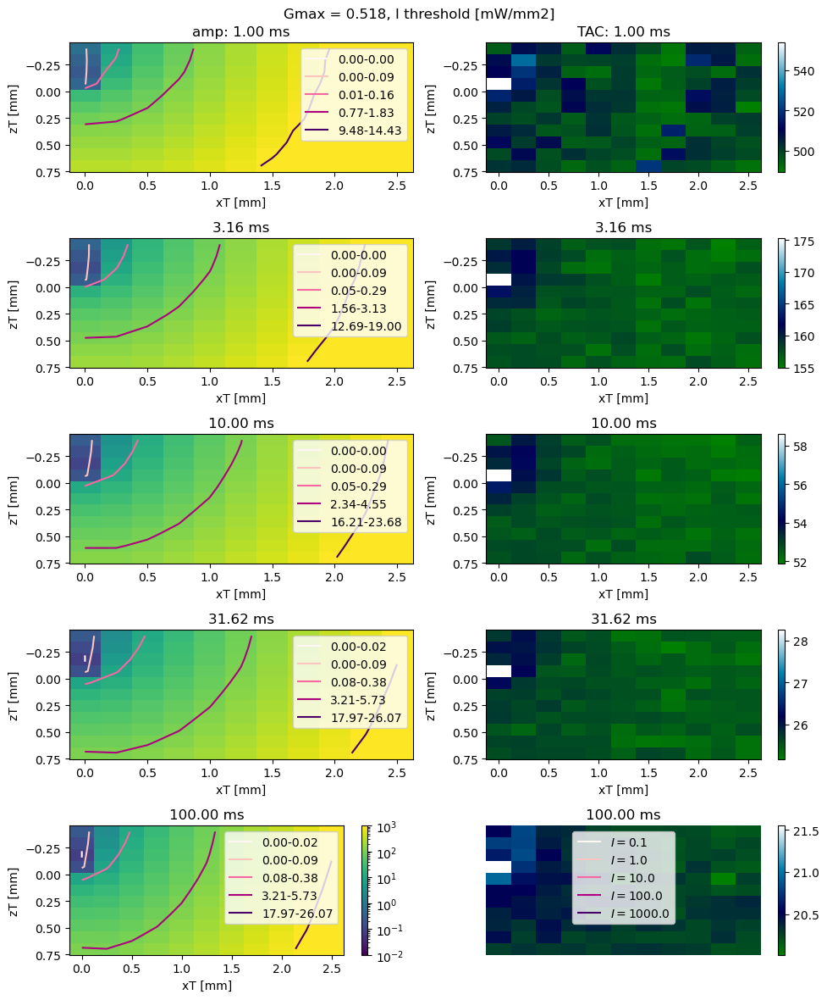

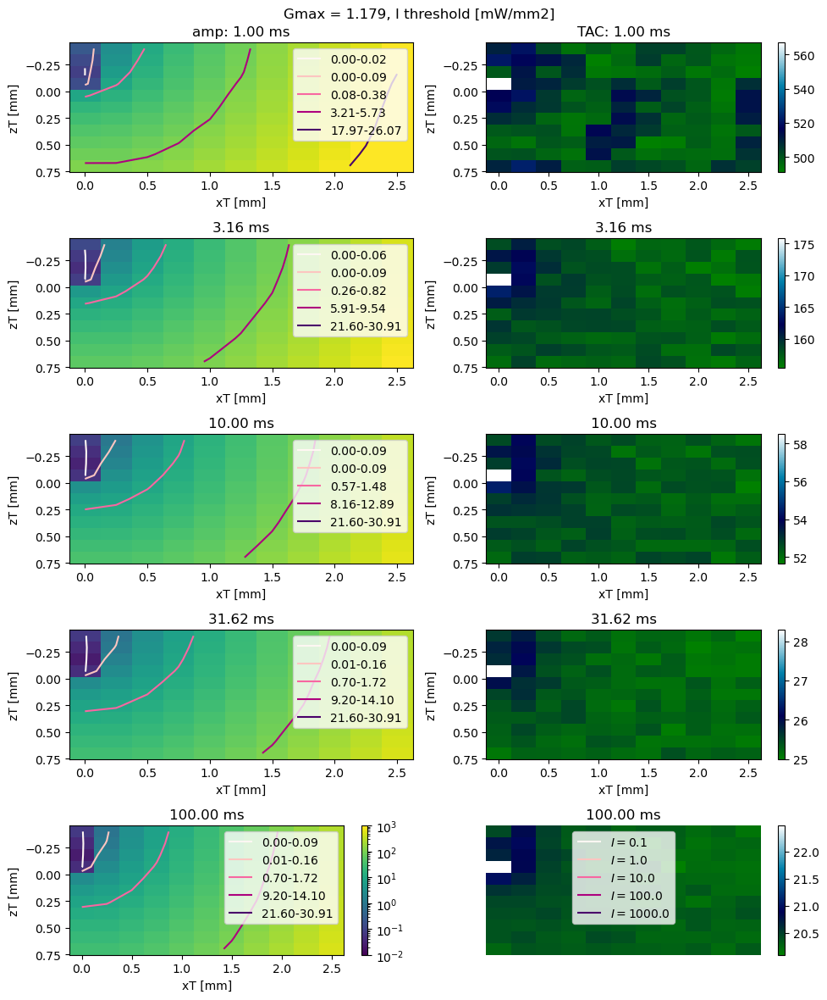

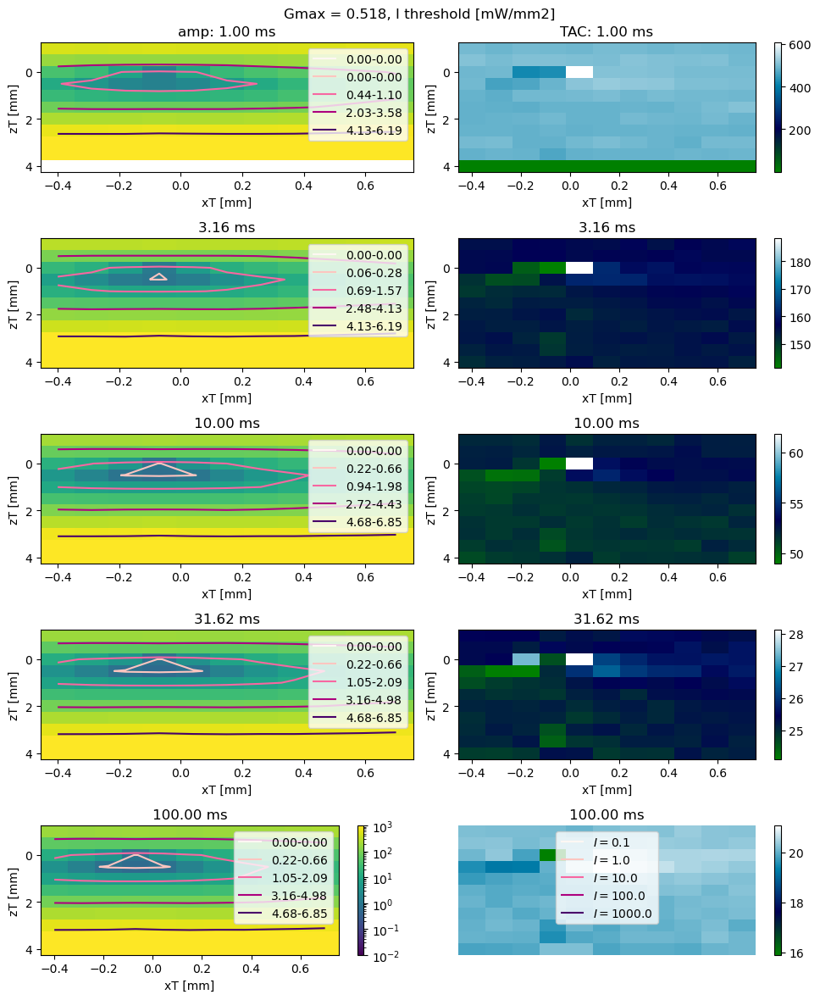

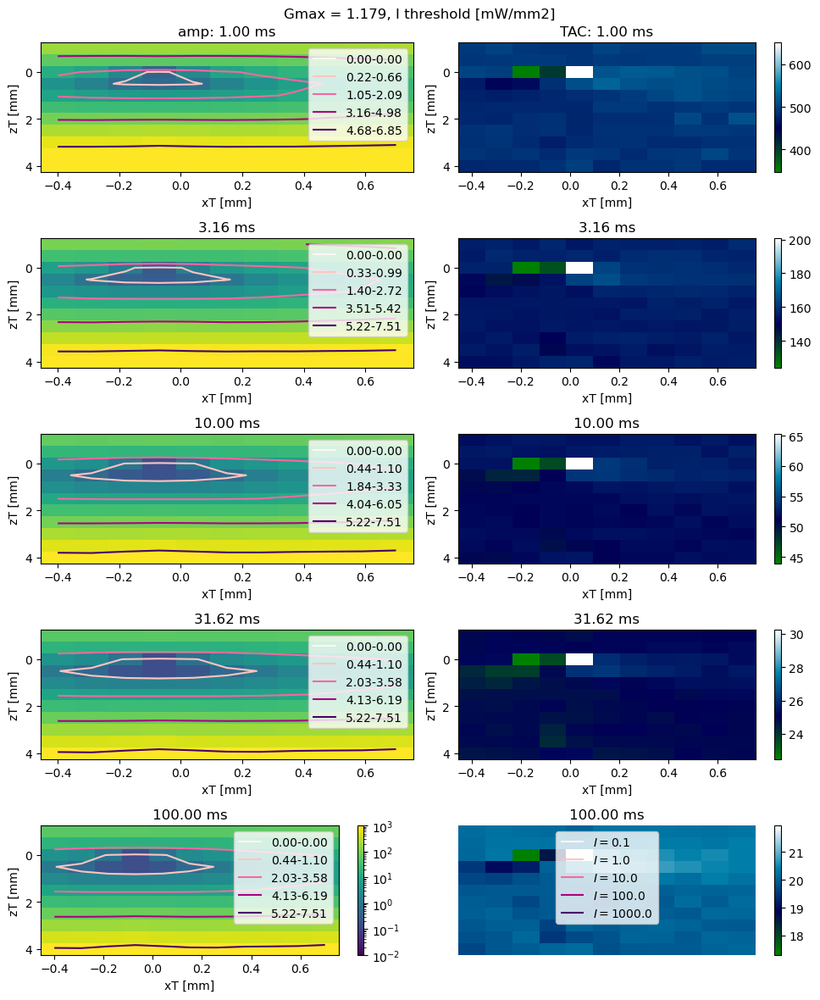

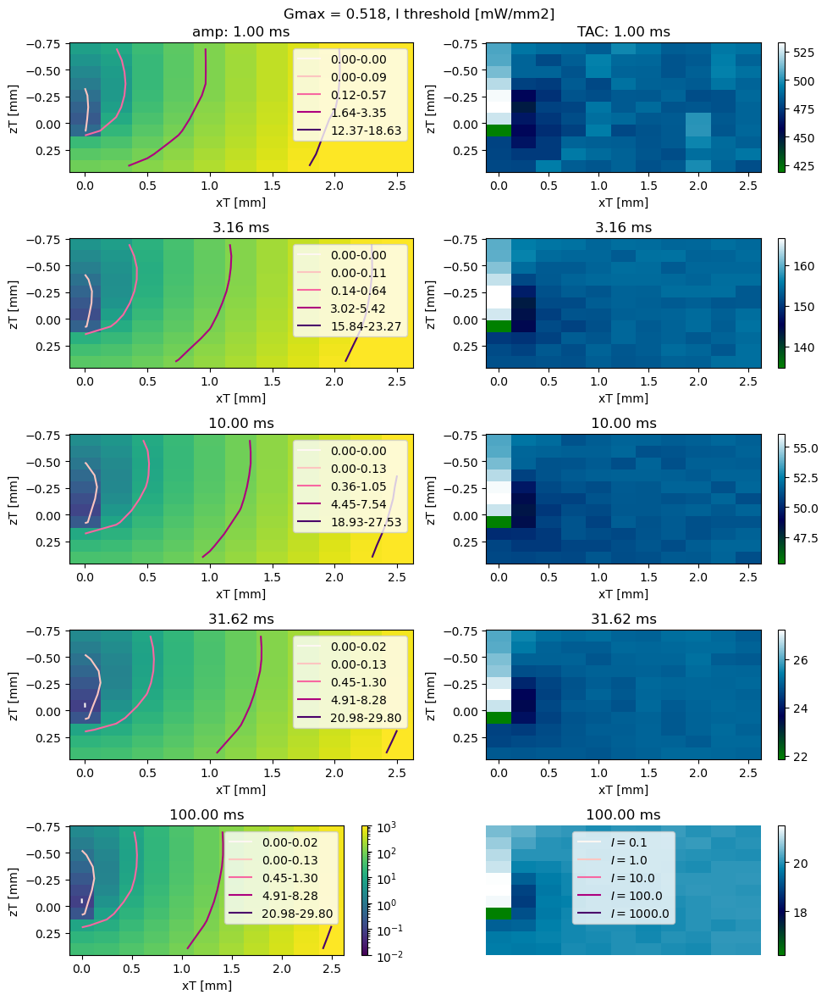

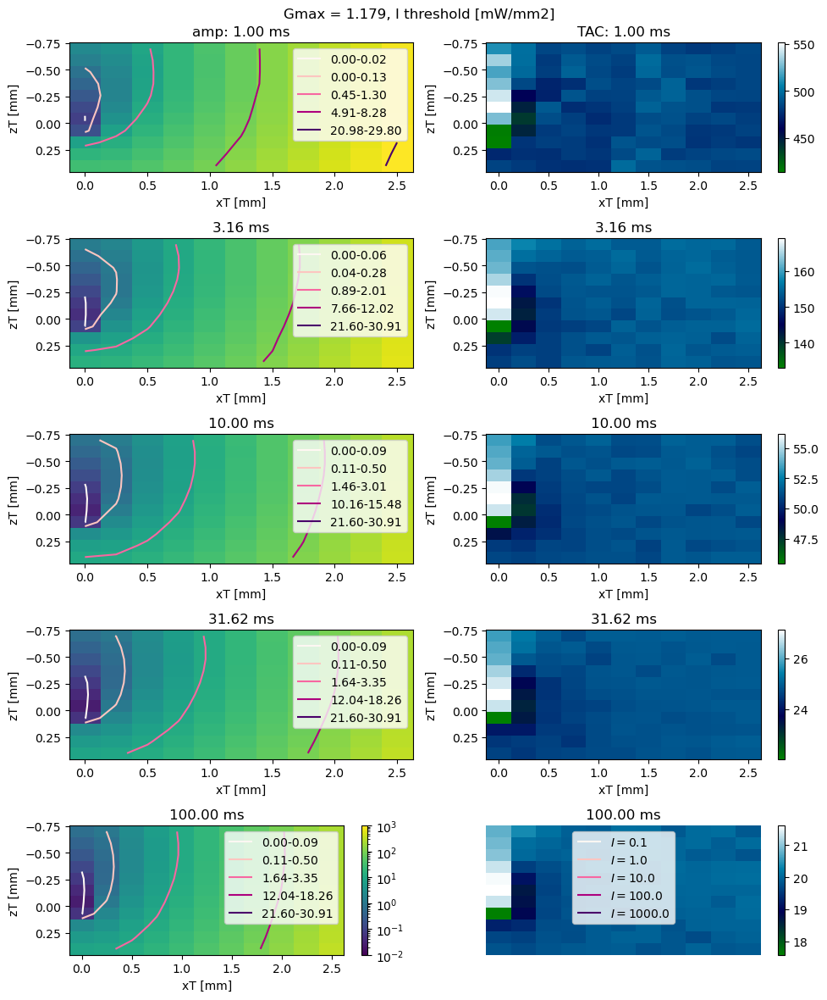

In [6]:
myselection_noGmax = {key:unique_values_columns_master[key][0] for key in [*cell_init_options,*settings_options,*opsin_options,*field_options] if not key in ['Gmax','distribution','theta_0','x_0','y_0','z_0']}
myselection_noGmax['opsinlocations'] = 'basaldend'
print(myselection_noGmax)
intm_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection_noGmax)]
gmaxs = list(intm_df['Gmax'].unique())
print_upscale = False
nan_tolerance_percentage = 0.95


for theta in unique_values_columns_master['theta_0']:
    for gmax in gmaxs[2:4]:
        myselection = {**myselection_noGmax, 'Gmax': gmax,'theta_0':theta}
        single_config_df = master_df[selection_generator(master_df,unique_values_columns_master,verbose=False,**myselection)].reset_index(drop=True)
        print(myselection)

        udurs = list(single_config_df['dur'].unique())
        fig,axs = plt.subplots(len(udurs),2,tight_layout = True,figsize=np.array([10,12]))
        for i, feat in enumerate(['amp','TAC']):
            if feat=='amp':
                levels = np.logspace(-1,3,5)
                norm_log = cm.colors.LogNorm(vmax=1000, vmin=0.01)
                norm_log_cntr = cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
                plot_cntr = True
            else:
                plot_cntr = False
            for dur,ax in zip(udurs,axs[:,i]):
                intm_df = single_config_df[single_config_df['dur']==dur]
                if not np.all(np.isnan(intm_df[feat])):
                    data_toplot = np.array((intm_df['x']+intm_df['x_0'],intm_df['z']+intm_df['z_0'],intm_df[feat])).T
                    # if ninterp, data_toplot[-1] is in 'ij' order
                    data_toplot = EcF.prepareDataforInterp(data_toplot,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(np.linspace(data_toplot[0].min(),data_toplot[0].max(),len(np.unique(data_toplot[0])),endpoint=True),np.linspace(data_toplot[1].min(),data_toplot[1].max(),len(np.unique(data_toplot[0])),endpoint=True),indexing='ij')

                    if sum(np.isnan(data_toplot[-1].flatten()))/len(data_toplot[-1].flatten()) < nan_tolerance_percentage:
                        if plot_cntr:
                            im,cntr,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,contour_kwargs={'norm':norm_log_cntr,'cmap':'RdPu','levels':levels})
                            h, l = cntr.legend_elements("I")
                            if theta!=0:
                                vta_low, vta_up = VTA2D_count_axialsym(yY,zZ,data_toplot[2],intensity = levels,gridorder = 'ij')
                            else:
                                vta_low, vta_up = SURFVTA2D_count(yY,zZ,data_toplot[2],intensity = levels,gridorder = 'ij')
                            ax.legend(h, [f'{x:0.2f}-{y:0.2f}' if ~np.isnan(x) else '-' for x,y in zip(vta_low,vta_up)],ncol=1,loc='upper right')
                        else:
                            TAC_min = np.nanmin(intm_df[feat])
                            TAC_max = np.nanmax(intm_df[feat])
                            norm_log = cm.colors.Normalize(vmax=TAC_max, vmin=TAC_min)
                            im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm_log,invert_yaxis=True,cmap='ocean')
                        ax.set_xlabel('xT [mm]')
                        ax.set_ylabel('zT [mm]')
                        ax.set_title(f'{dur:0.2f} ms')
                if dur==udurs[0]:
                    ax.set_title(f'{feat}: {dur:0.2f} ms')
                if dur!=udurs[-1] and feat=='amp':
                    cb.remove()


        fig.suptitle(f'Gmax = {gmax:0.3f}, I threshold [mW/mm2]')
        try:
            h, l = cntr.legend_elements("I")
            axs[-1,-1].legend(h, l,ncol=1,loc='upper center')
            axs[-1,-1].axis('off')
            #cb = fig.colorbar(im,ax=axs[-1,-2])
        except:
            pass
        print()

# VTA/STA

In [20]:
vta_filename = 'vta_logspace(-1,3,9).csv'
vta_df = loader.load_vta_df(filepath, vta_filename, recollect = False)
vta_df.head()
for x in ['Gmax','dur','level','theta_0']:
    vta_df[x] = np.round(vta_df[x],2)

for x in ['vta_low','vta_up','surf_low','surf_up','dur','Gmax','level']:
    vta_df[x+'_log10'] = np.round(np.log10(vta_df[x]),4)
vta_df['neurontemplate'].unique()

vta_df['neurontemplate'] = vta_df['neurontemplate'].replace({'CA1_PC_cAC_sig5':'pyr_1', 'CA1_PC_cAC_sig6':'pyr_2', 'cNACnoljp1':'bc_1', 'cNACnoljp2':'bc_2'})
vta_df[['celltype','number']] = vta_df['neurontemplate'].str.split('_',expand=True)
vta_columns=vta_df.columns

vta_limit_df = vta_df.copy()
for x,maxsurf in zip(['surf_low','surf_up'],[2.5*1.1,2.75*1.32]):
    vta_limit_df[x] = np.minimum(vta_limit_df[x],np.round(maxsurf,4))
    vta_limit_df[x+'_log10'] = np.minimum(vta_limit_df[x+'_log10'],np.round(np.log10(maxsurf),4))

unique_values_columns_vta = {key: vta_df[key].unique() for key in vta_columns}
for x in ['vta_low','vta_up','surf_low','surf_up','dur','Gmax','level']:
    unique_values_columns_vta[x] = np.sort(unique_values_columns_vta[x])
    unique_values_columns_vta[x+'_log10'] = np.sort(unique_values_columns_vta[x+'_log10'])

for theta in unique_values_columns_vta['theta_0']:
    if theta!=0:
        label = 'z'
    else:
        label = 'x'
    vta_df.loc[vta_df['theta_0']==theta,label+'_0']*=-1
for x in ['b_opt_pos','b_opt_pos_TAC', 'w_opt_pos_TAC']:
    vta_df[x]*=-1000
vta_df.head()

c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rschoete\miniconda\envs\Optogx_analysis\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,vta_low,vta_up,surf_low,surf_up,b_opt_pos,b_opt_pos_TAC,w_opt_pos_TAC,dur,level,Gmax,...,settings_str,vta_low_log10,vta_up_log10,surf_low_log10,surf_up_log10,dur_log10,Gmax_log10,level_log10,celltype,number
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.10,0.1,...,1.0_0_-1.5707963267948966_0_CA1_PC_cAC_sig5_0_...,NaN,NaN,NaN,NaN,0.0,-1.0,-1.0000,pyr,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.32,0.1,...,1.0_0_-1.5707963267948966_0_CA1_PC_cAC_sig5_0_...,NaN,NaN,NaN,NaN,0.0,-1.0,-0.4949,pyr,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.00,0.1,...,1.0_0_-1.5707963267948966_0_CA1_PC_cAC_sig5_0_...,NaN,NaN,NaN,NaN,0.0,-1.0,0.0000,pyr,1
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.16,0.1,...,1.0_0_-1.5707963267948966_0_CA1_PC_cAC_sig5_0_...,NaN,NaN,NaN,NaN,0.0,-1.0,0.4997,pyr,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,10.00,0.1,...,1.0_0_-1.5707963267948966_0_CA1_PC_cAC_sig5_0_...,NaN,NaN,NaN,NaN,0.0,-1.0,1.0000,pyr,1


## surfaces of activation for 100 mW/mm2 LightSource output

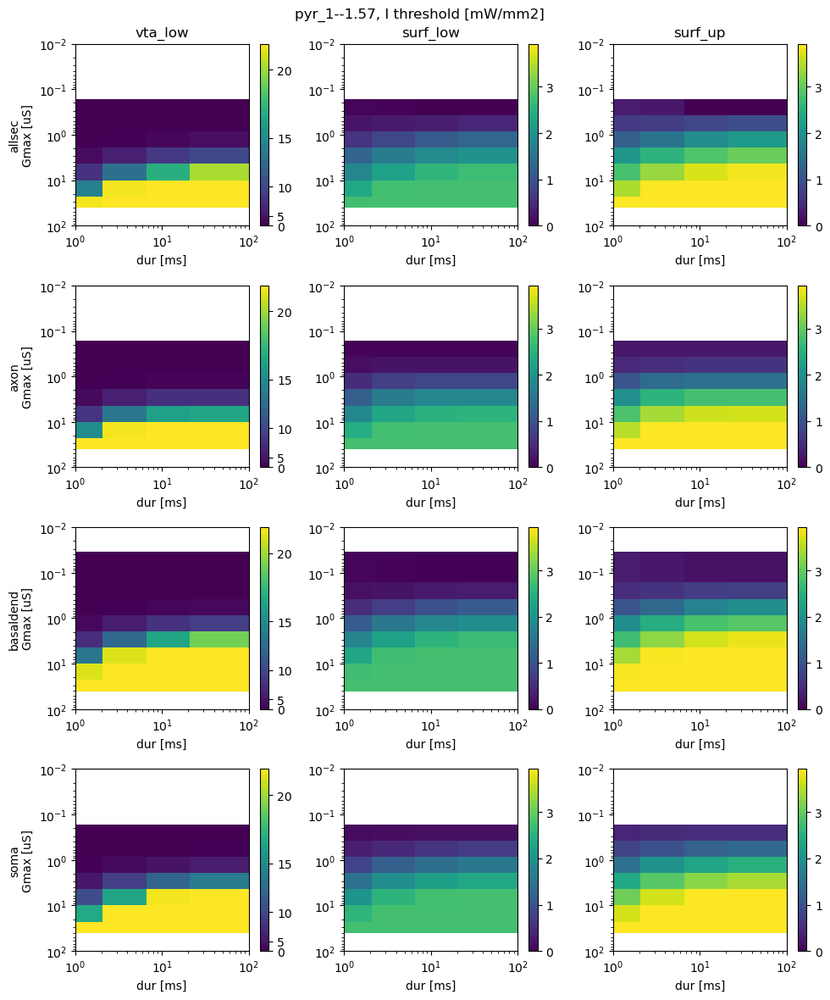

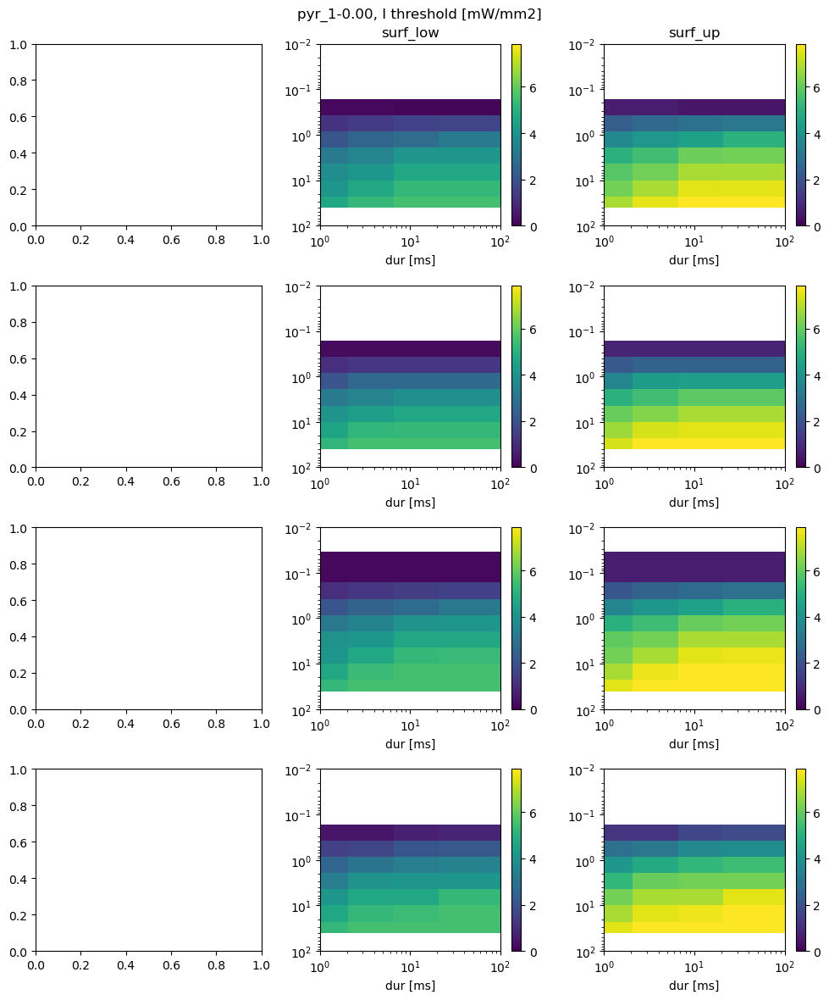

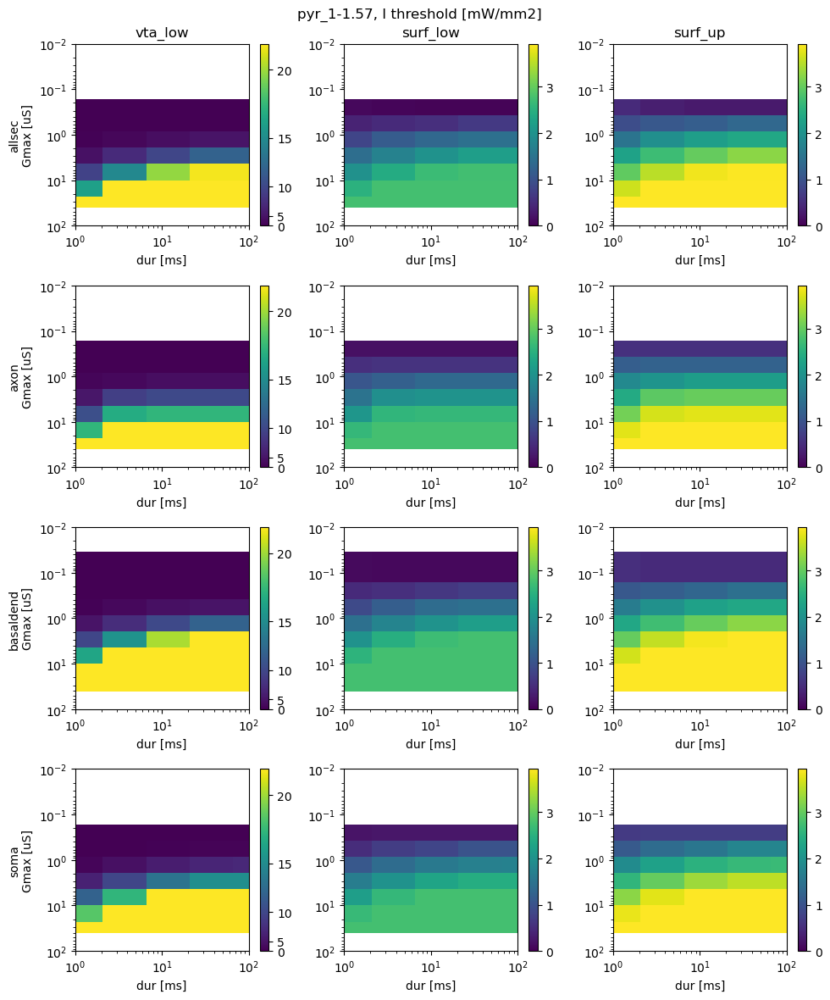

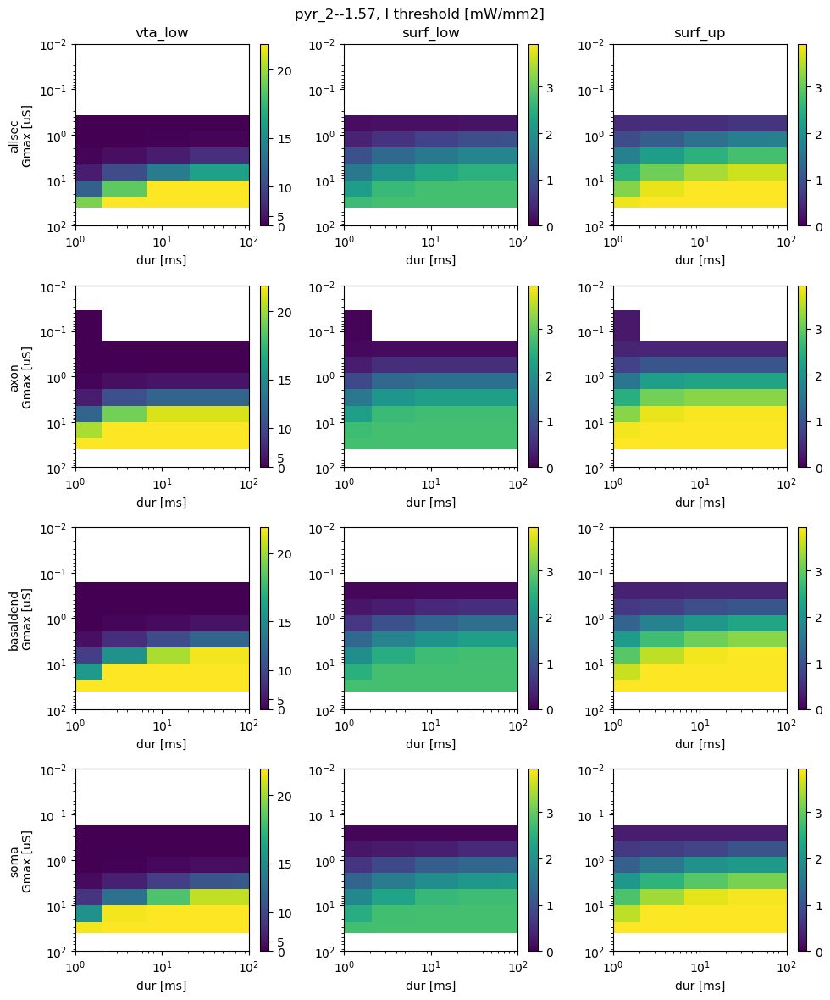

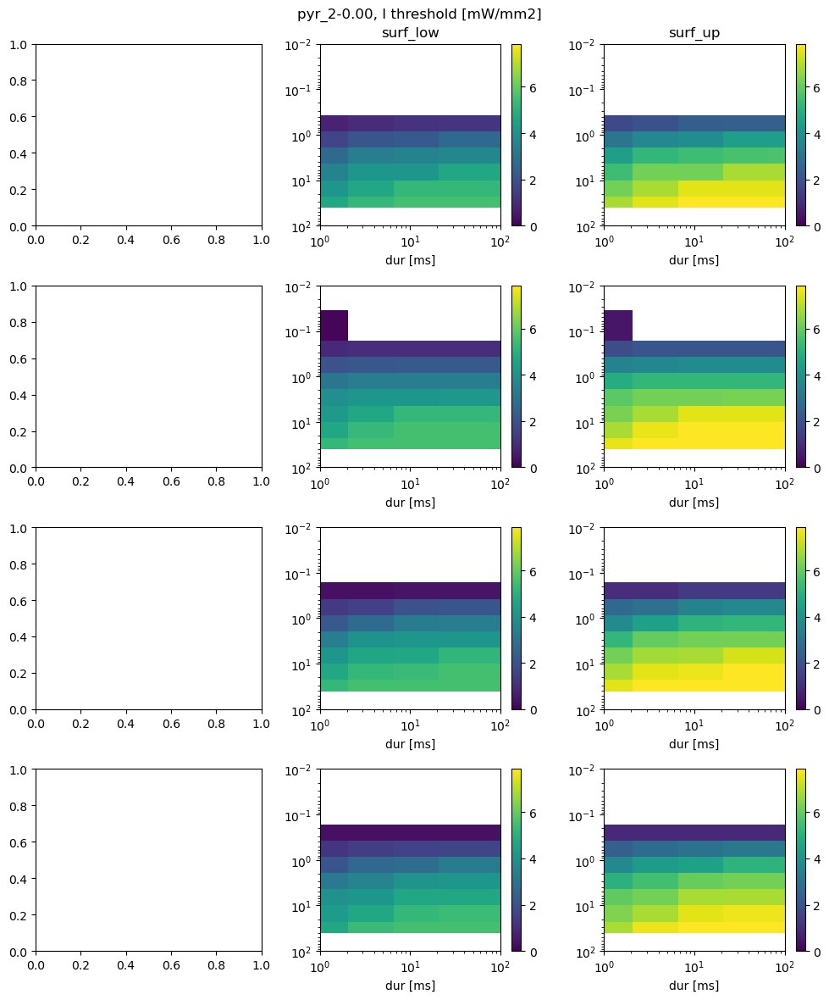

...

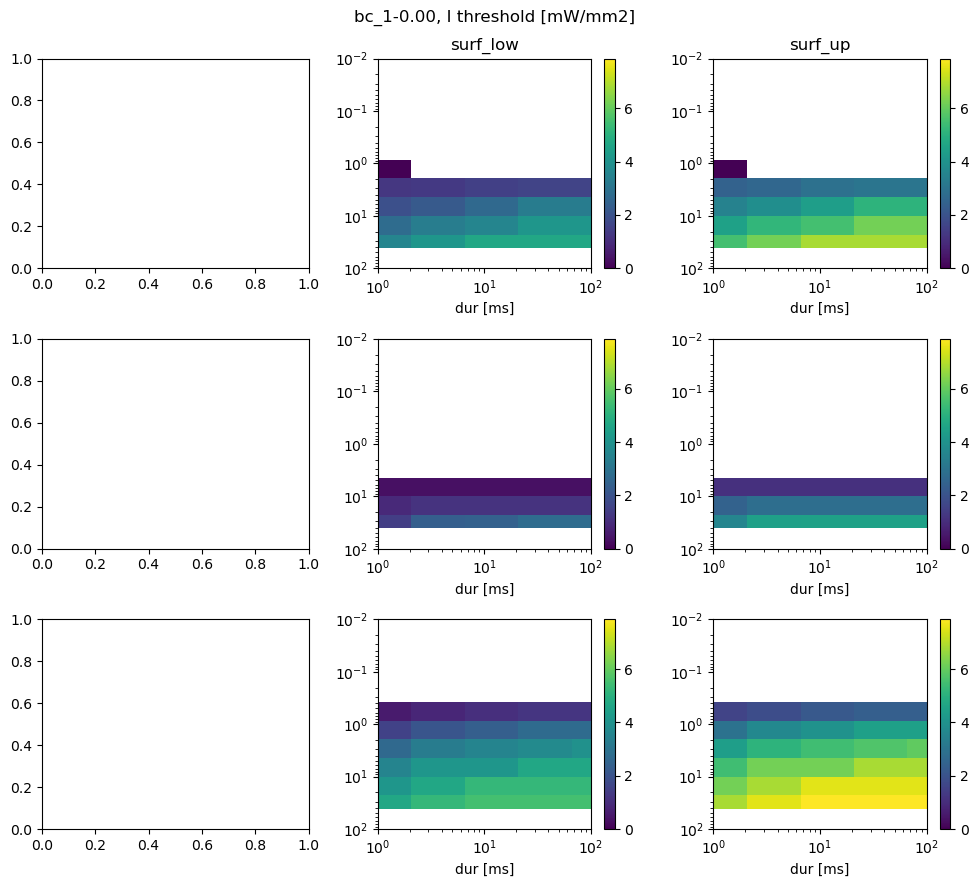

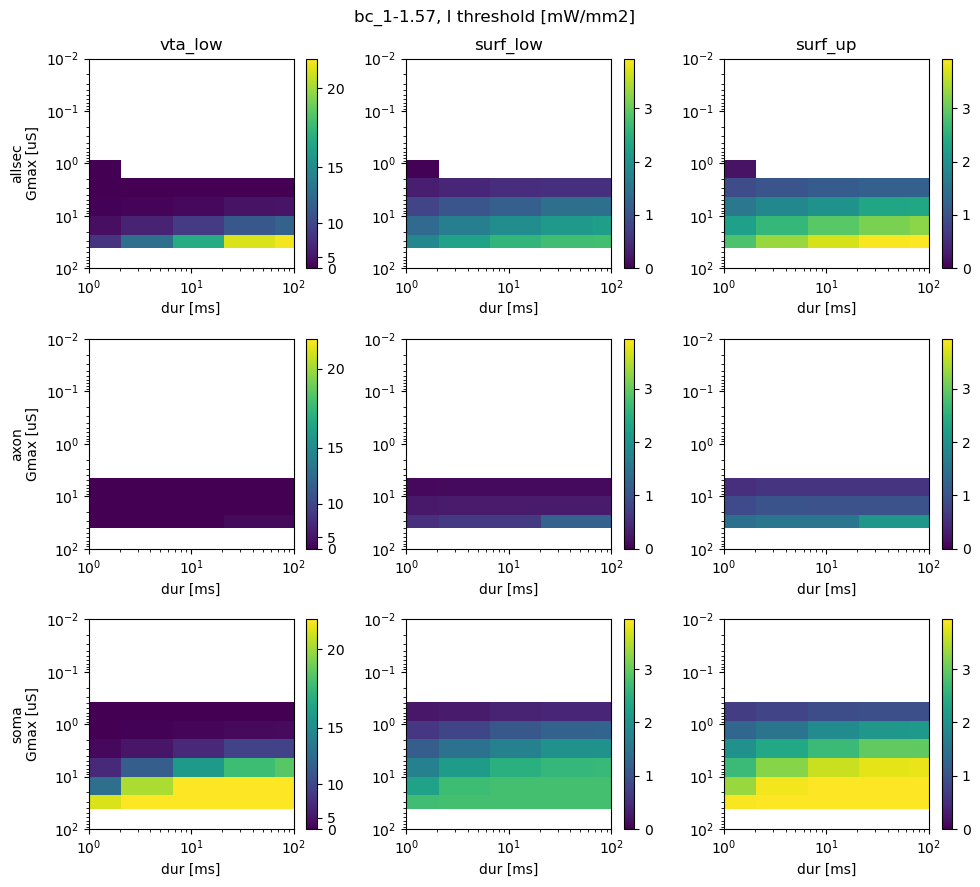

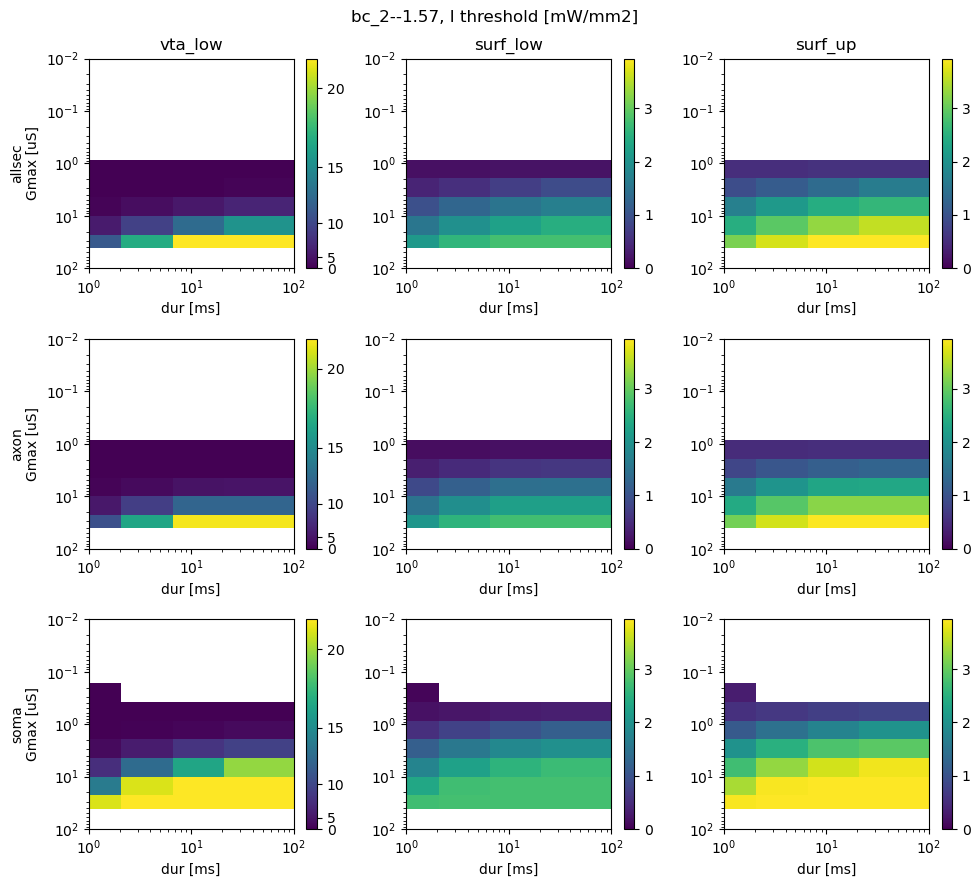

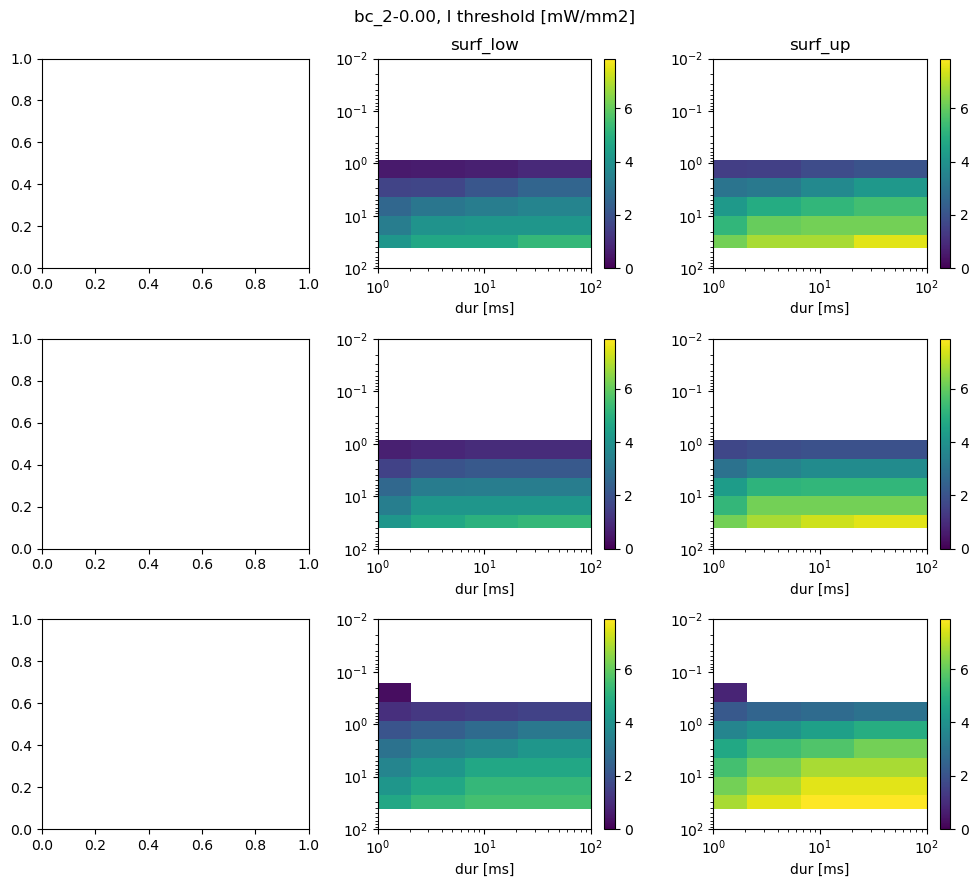

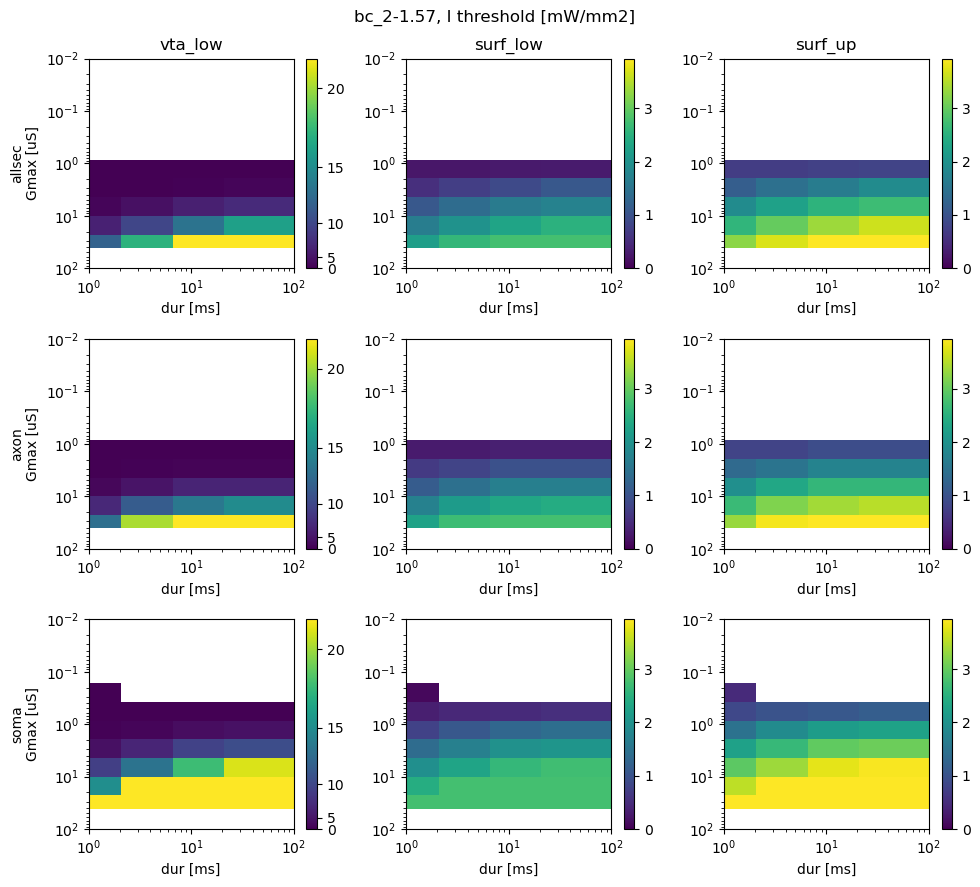

In [5]:

levels = [0.1,1,10]
norm_log_cntr = cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
for neurontemplate in unique_values_columns_vta['neurontemplate']:
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,level=100,theta_0=pitch)]
        uAxesVals = fig_df['opsinlocations'].unique()
        fig,axs = plt.subplots(len(uAxesVals),3,tight_layout = True,figsize = (10,3*len(uAxesVals)))
        for i,datalabel in enumerate(['vta_low','surf_low','surf_up']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0#np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up','surf_low']].values)
                    norm = cm.colors.Normalize(vmax=Imax, vmin=Imin)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = cm.colors.PowerNorm(gamma=2,vmax=Imax, vmin=Imin)
                # if Imin<=0 or pitch ==0:
                # else:
                #     norm = cm.colors.LogNorm(vmax=Imax, vmin=Imin)
                for oL,ax in zip(uAxesVals,axs[:,i]):
                    intm_df = fig_df[fig_df['opsinlocations']==oL]
                    data_toplot = EcF.prepareDataforInterp(np.array((intm_df['dur'],intm_df['Gmax'],intm_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim((min(intm_df['dur'].unique()),max(intm_df['dur'].unique())))
                    ax.set_yscale('log')
                    ax.set_ylim((1e-2,1e2))
                    ax.invert_yaxis()
                    ax.set_xlabel('dur [ms]')
                    if i==0:
                        ax.set_ylabel(f'{oL}\nGmax [uS]')
                    if oL == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{neurontemplate}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## Surfaces of activation opsin location = allsec

[array(['allsec', 'axon', 'basaldend', 'soma'], dtype=object), array(['CA1_PC_cAC_sig5', 'CA1_PC_cAC_sig6', 'cNACnoljp1', 'cNACnoljp2'],
      dtype=object)]














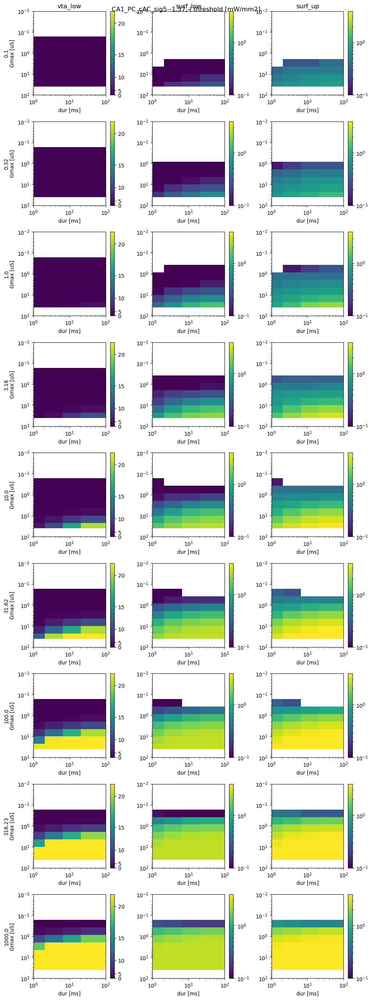

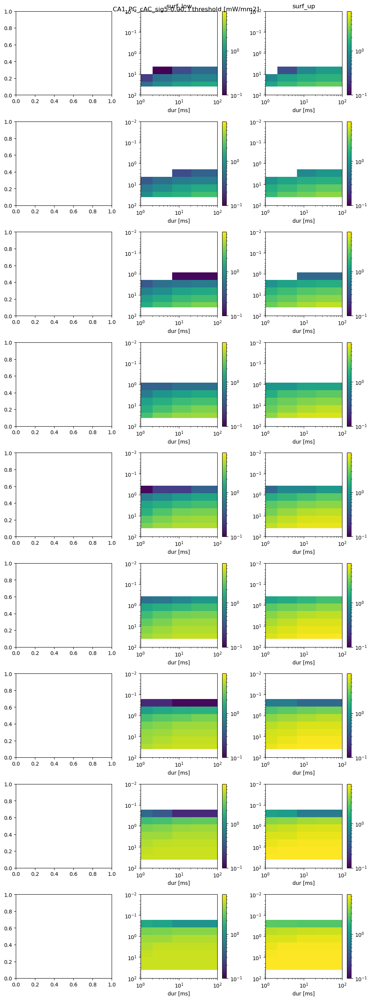

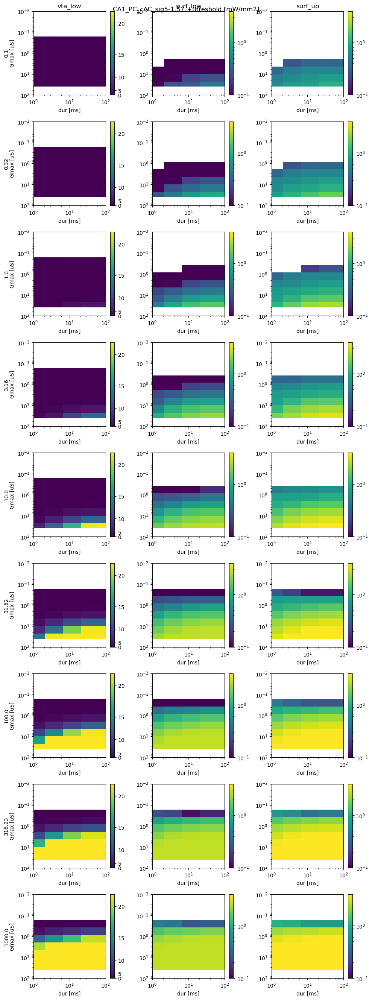

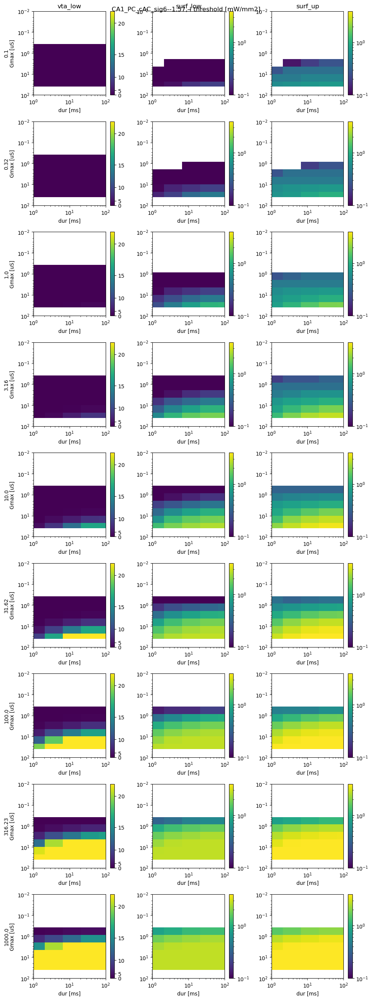

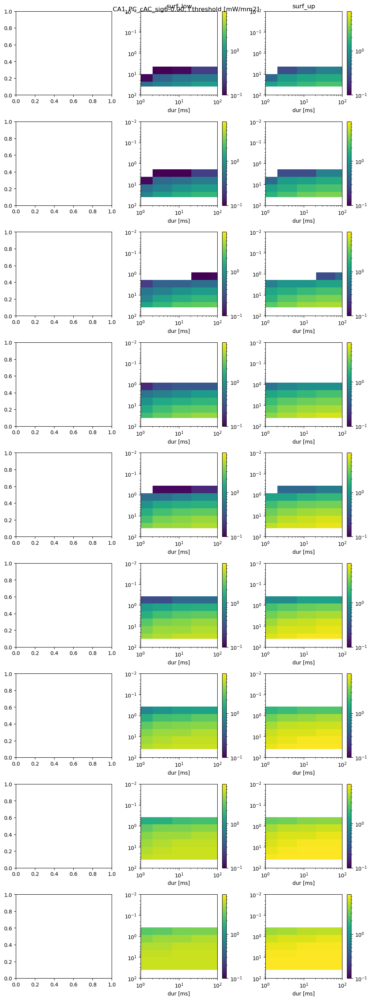

...

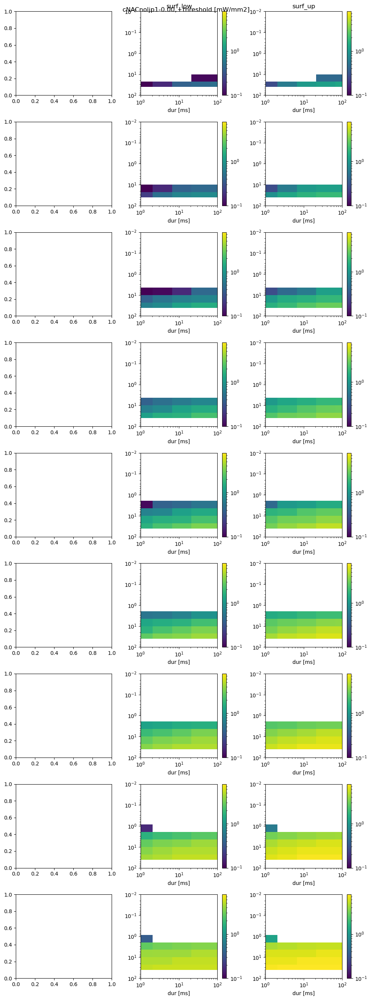

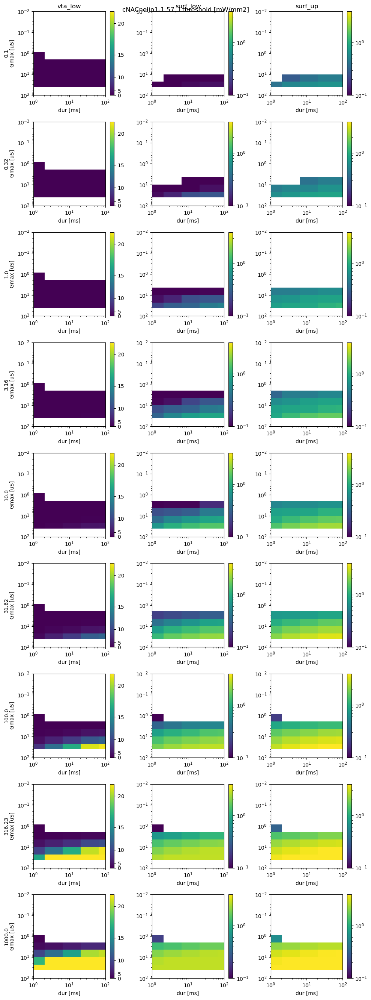

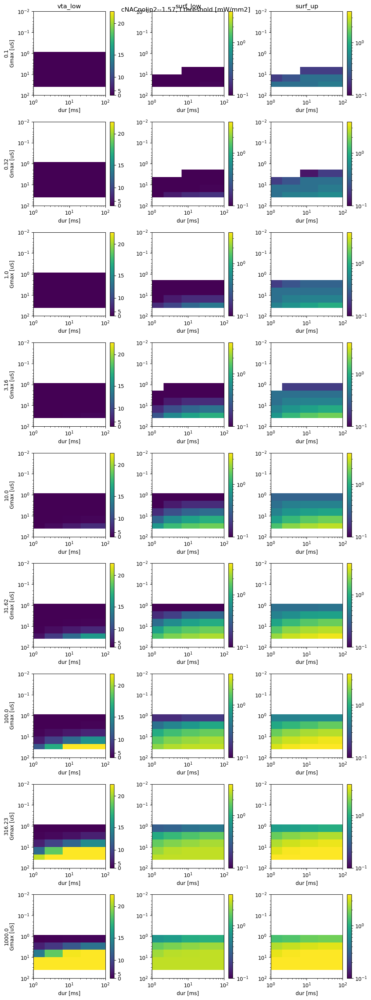

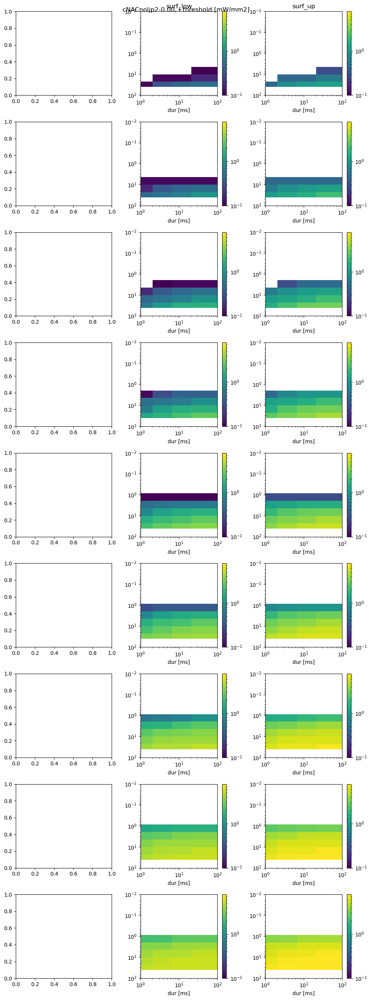

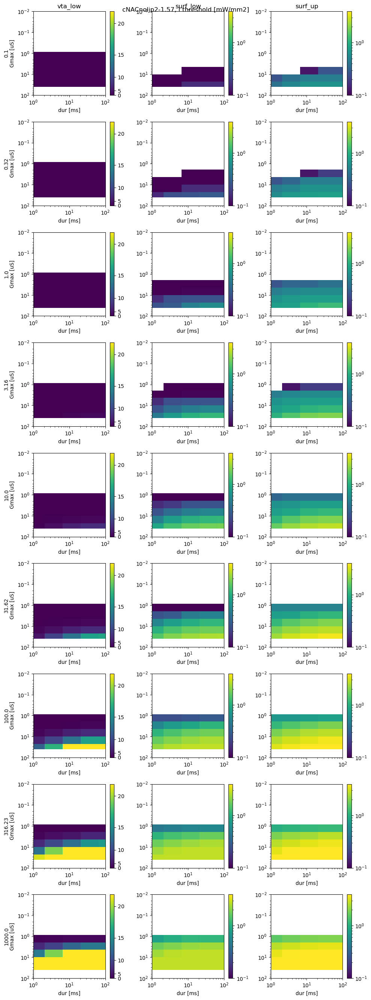

In [7]:
variables = ['opsinlocations','neurontemplate']
print([unique_values_columns_vta[key] for key in variables])
levels = [0.1,1,10]
norm_log_cntr = cm.colors.LogNorm(vmax=levels[-1], vmin=levels[0])
for neurontemplate in unique_values_columns_vta['neurontemplate']:
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,opsinlocations='allsec',theta_0=pitch)]
        uAxesVals = fig_df['level'].unique()
        fig,axs = plt.subplots(len(uAxesVals),3,tight_layout = True,figsize = (10,3*len(uAxesVals)))
        for i,datalabel in enumerate(['vta_low','surf_low','surf_up']):
            if not all(np.isnan(fig_df[datalabel])):
                Imin = 0#np.nanmin(fig_df[datalabel])
                if 'surf' in datalabel:
                    Imax = np.nanmax(fig_df[['surf_up','surf_low']].values)
                    norm = cm.colors.LogNorm(vmax=Imax, vmin=0.1)
                else:
                    Imax = np.nanmax(fig_df[datalabel])
                    norm = cm.colors.PowerNorm(gamma=2,vmax=Imax, vmin=Imin)
                # if Imin<=0 or pitch ==0:
                # else:
                #     norm = cm.colors.LogNorm(vmax=Imax, vmin=Imin)
                for uAV,ax in zip(uAxesVals,axs[:,i]):
                    intm_df = fig_df[fig_df['level']==uAV]
                    data_toplot = EcF.prepareDataforInterp(np.array((intm_df['dur'],intm_df['Gmax'],intm_df[datalabel])).T,'ninterp',sorted=False)
                    yY, zZ = np.meshgrid(data_toplot[0],data_toplot[1],indexing='ij')

                    im,cb = EcF.slicePlot(data_toplot,ax,fig,plotGrid=(yY,zZ),structured=True, norm=norm)
                    ax.set_xscale('log')
                    ax.set_xlim((min(intm_df['dur'].unique()),max(intm_df['dur'].unique())))
                    ax.set_yscale('log')
                    ax.set_ylim((1e-2,1e2))
                    ax.invert_yaxis()
                    ax.set_xlabel('dur [ms]')
                    if i==0:
                        ax.set_ylabel(f'{uAV}\nGmax [uS]')
                    if uAV == uAxesVals[0]:
                        ax.set_title(datalabel)
        fig.suptitle(f'{neurontemplate}-{pitch:0.2f}, I threshold [mW/mm2]')
        print()

## change in surf for intensity fixed pulse duration 10 ms  wrt Optrode level

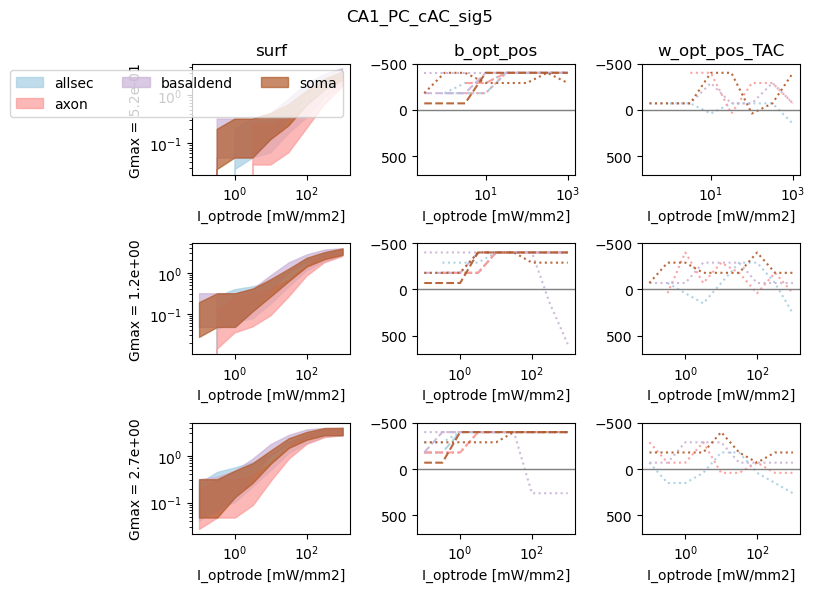

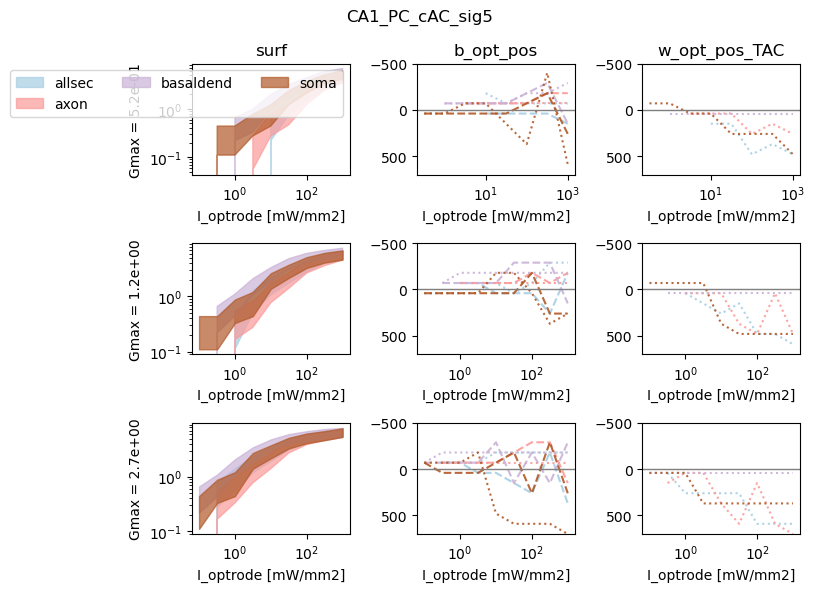

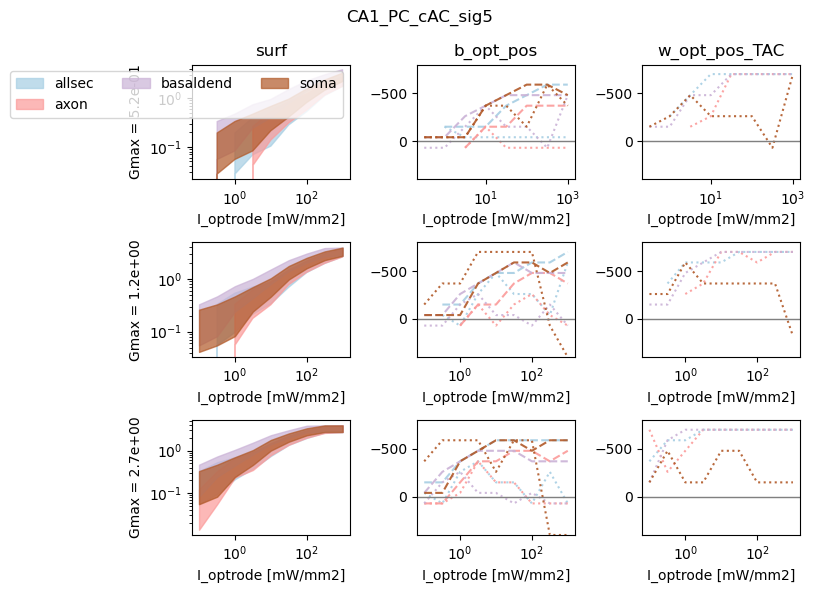

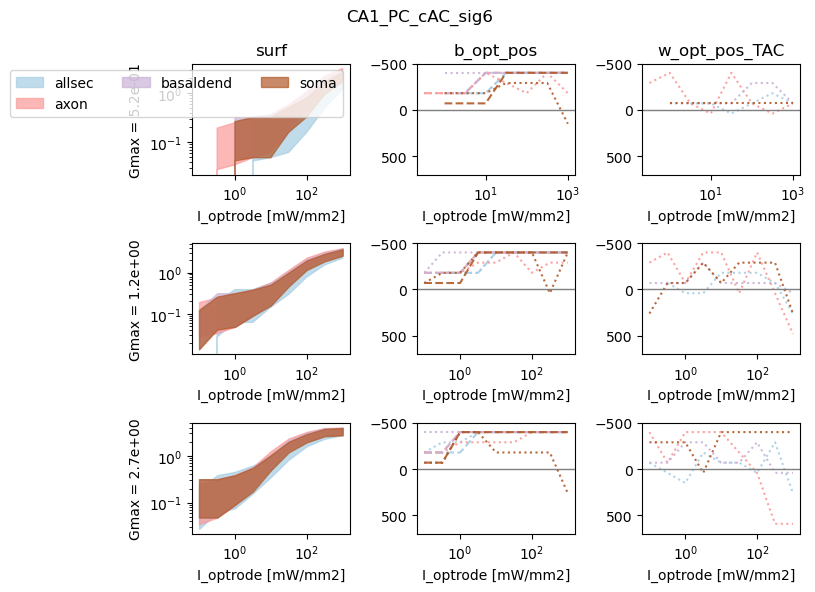

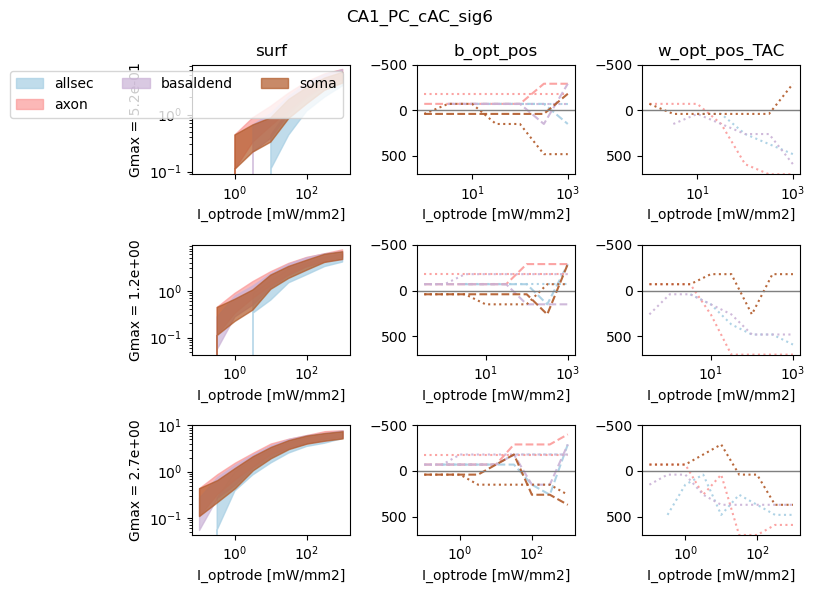

...

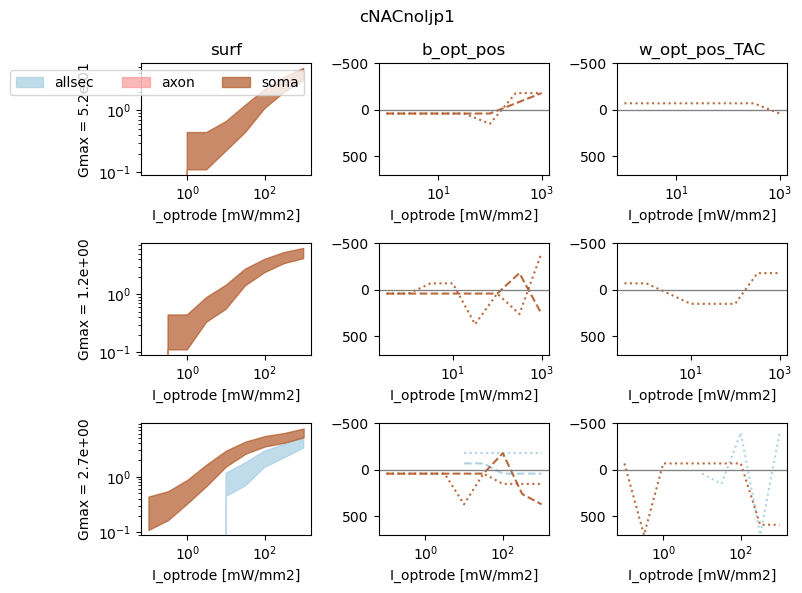

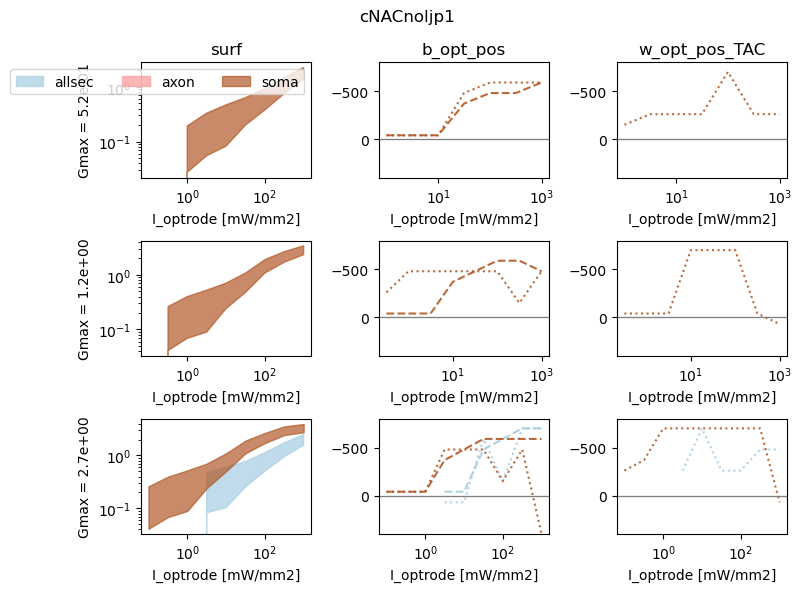

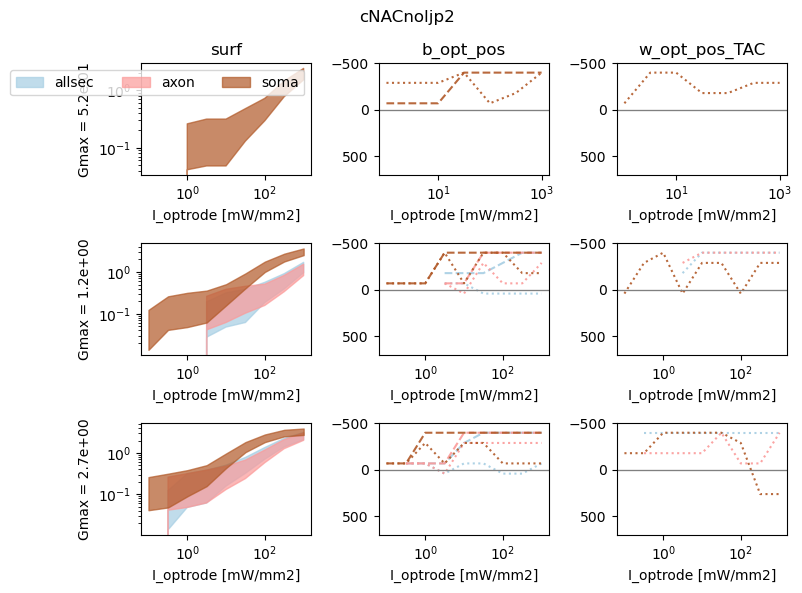

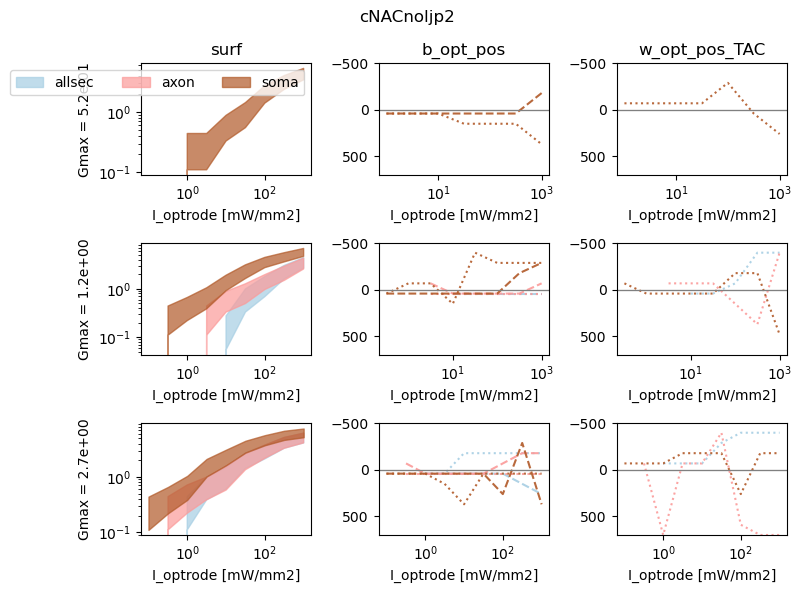

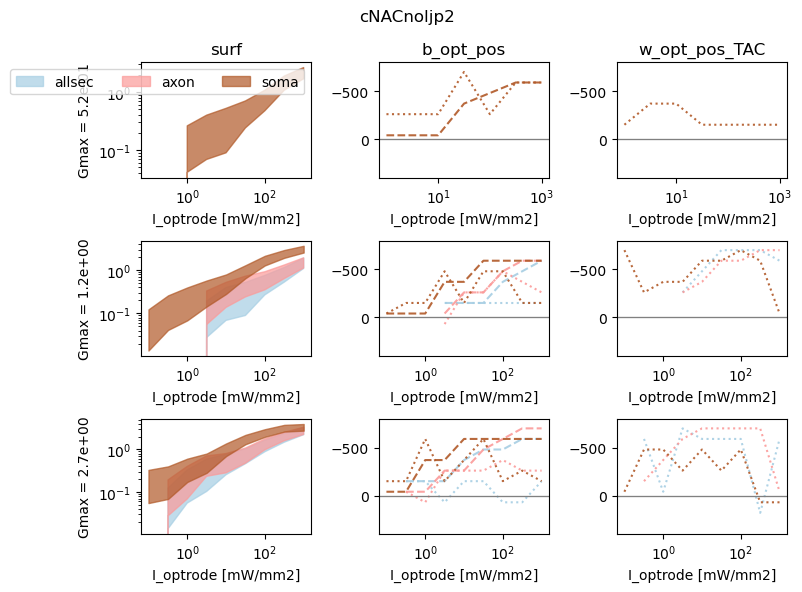

In [10]:
colors = plt.get_cmap('Paired',len(unique_values_columns_vta['opsinlocations'])).colors
colorpairs = {x:clr for x,clr in zip(unique_values_columns_vta['opsinlocations'],colors)}
linestyle_str = ['solid', 'dotted', 'dashed', 'dashdot']
uGmax = np.sort(vta_df['Gmax'].unique())[2:5]


for neurontemplate,linestyle in zip(unique_values_columns_vta['neurontemplate'],linestyle_str):
    for pitch in unique_values_columns_vta['theta_0']:
        fig_df = vta_df[selection_generator(vta_df,unique_values_columns=unique_values_columns_vta,neurontemplate=neurontemplate,dur=10,theta_0=pitch)]
        uGmax = np.sort(fig_df['Gmax'].unique())[2:5]
        fig,axs = plt.subplots(len(uGmax),3,tight_layout = True,figsize = (8,2*len(uGmax)))
        for i,datalabel in enumerate(['surf','b_opt_pos','w_opt_pos_TAC']):
            for uG,ax in zip(uGmax,axs[:,i]):
                logscale = False
                intm_df = fig_df[fig_df['Gmax']==uG]
                uOpsinLocations = [x for x in intm_df['opsinlocations'].unique()]
                for oL in uOpsinLocations[:]:
                    clr = colorpairs[oL]
                    plot_df = intm_df[intm_df['opsinlocations']==oL]
                    xdata = plot_df['level']

                    if datalabel == 'surf':
                        ydata = plot_df['surf_low']
                        ax.fill_between(xdata, plot_df['surf_low'], plot_df['surf_up'], color=clr, alpha=0.7,label=oL)
                        if sum(~ np.isnan(ydata))>0:
                            logscale = True
                    elif datalabel=='w_opt_pos_TAC':
                        ydata = plot_df['w_opt_pos_TAC']
                        ax.plot(xdata,plot_df['w_opt_pos_TAC'], linestyle=':',color=clr, alpha=0.9)
                        ax.axhline(0, color='grey', linewidth=0.8)
                        ax.set_xscale('log')
                        if pitch!=0:
                            minz = min(master_df.query(f"theta_0=={pitch}")['z'])*1000
                            ax.set_ylim((minz+plot_df['z_0'].iloc[0]-100,plot_df['z_0'].iloc[0]))
                        else:
                            minx = min(master_df.query(f"theta_0=={pitch}")['x'])*1000
                            ax.set_ylim((minx+plot_df['x_0'].iloc[0]-100,plot_df['x_0'].iloc[0]))
                        ax.invert_yaxis()
                    else:
                        ydata = plot_df['b_opt_pos']
                        ax.plot(xdata,plot_df['b_opt_pos'], linestyle='--',color=clr, alpha=0.9)
                        ax.plot(xdata,plot_df['b_opt_pos_TAC'], linestyle=':',color=clr, alpha=0.9)
                        ax.axhline(0, color='grey', linewidth=0.8)
                        ax.set_xscale('log')
                        if pitch!=0:
                            minz = min(master_df.query(f"theta_0=={pitch}")['z'])*1000
                            ax.set_ylim((minz+plot_df['z_0'].iloc[0]-100,plot_df['z_0'].iloc[0]))
                        else:
                            minx = min(master_df.query(f"theta_0=={pitch}")['x'])*1000
                            ax.set_ylim((minx+plot_df['x_0'].iloc[0]-100,plot_df['x_0'].iloc[0]))
                        ax.invert_yaxis()


                if logscale:
                    ax.set_xscale('log')
                    ax.set_yscale('log')
                ax.set_xlabel('I_optrode [mW/mm2]')
                if i==0:
                    ax.set_ylabel(f'Gmax = {uG:0.1e}')
                if uG == uGmax[0]:
                    ax.set_title(datalabel)
                    if i==0:
                        ax.legend(ncol=3)


        fig.suptitle(f'{neurontemplate}')
        print()

# STATISTICS


In [6]:
vta_df.columns

Index(['vta_low', 'vta_up', 'surf_low', 'surf_up', 'b_opt_pos',
       'b_opt_pos_TAC', 'w_opt_pos_TAC', 'dur', 'level', 'Gmax',
       'distribution', 'opsinmech', 'distribution_method', 'opsinlocations',
       'field', 'nPulse', 'phi_0', 'theta_0', 'psi_0', 'neurontemplate', 'x_0',
       'y_0', 'z_0', 'seed', 'celsius', 'dt', 'phi', 'theta', 'psi',
       'settings_str', 'vta_low_log10', 'vta_up_log10', 'surf_low_log10',
       'surf_up_log10', 'dur_log10', 'Gmax_log10', 'level_log10', 'celltype',
       'number'],
      dtype='object')

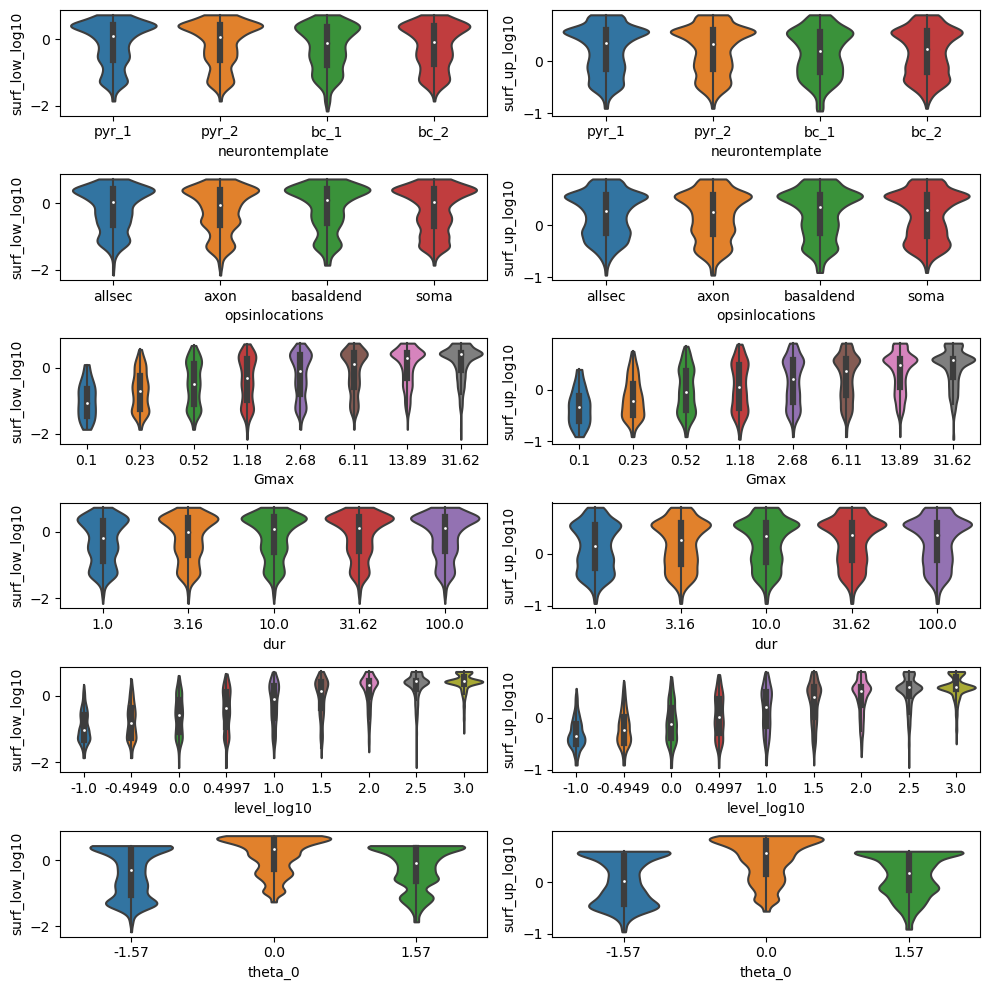

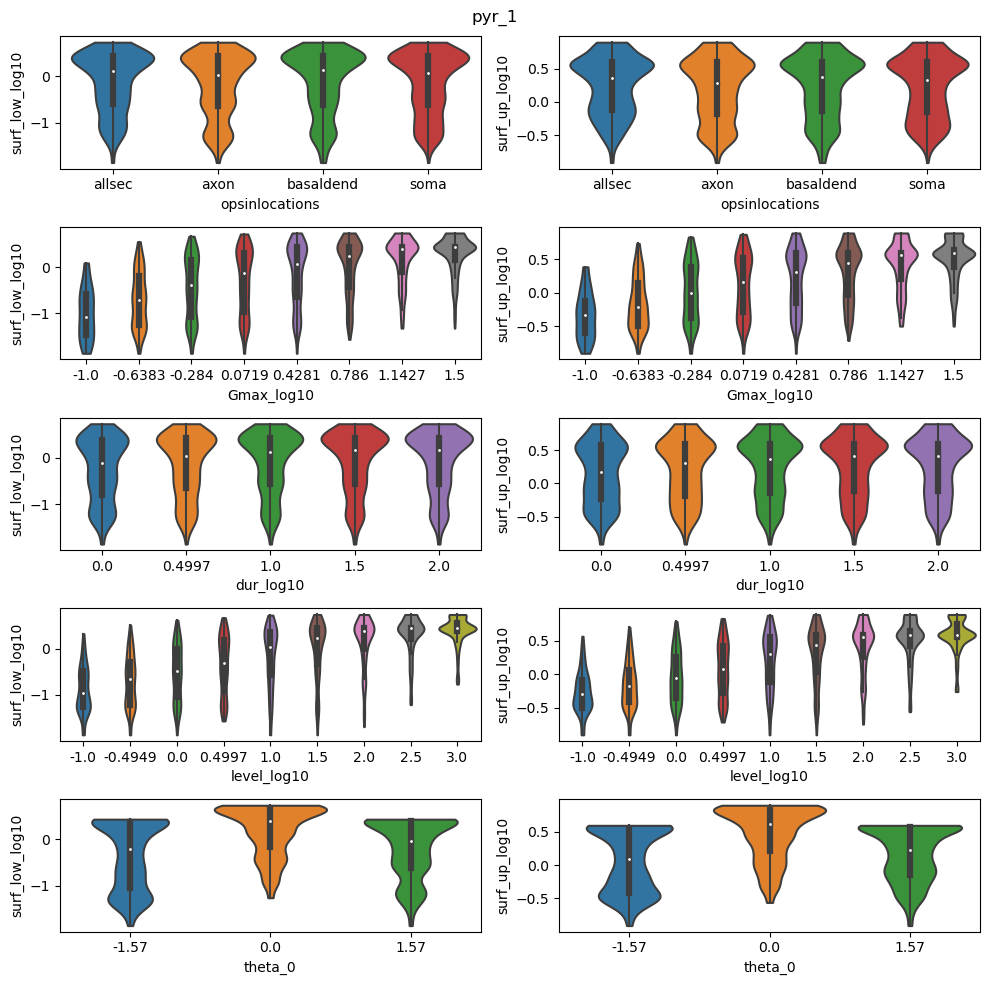

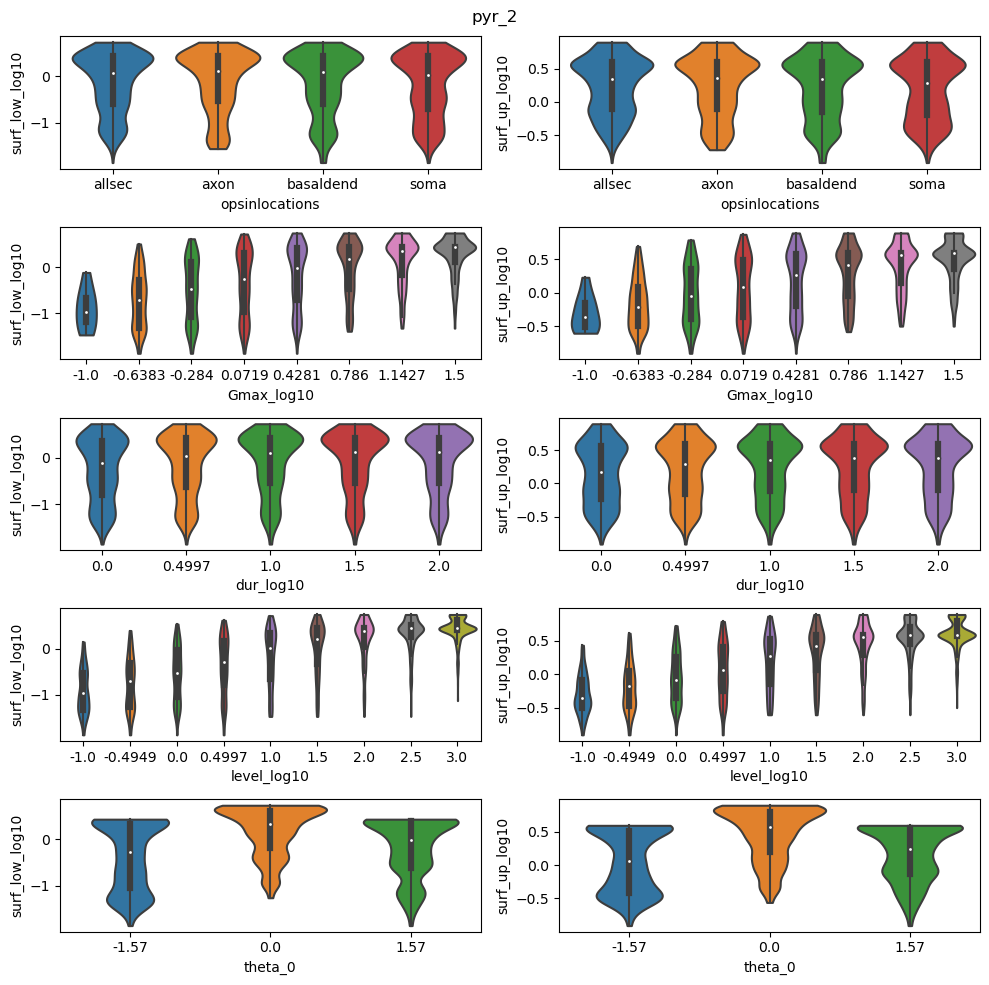

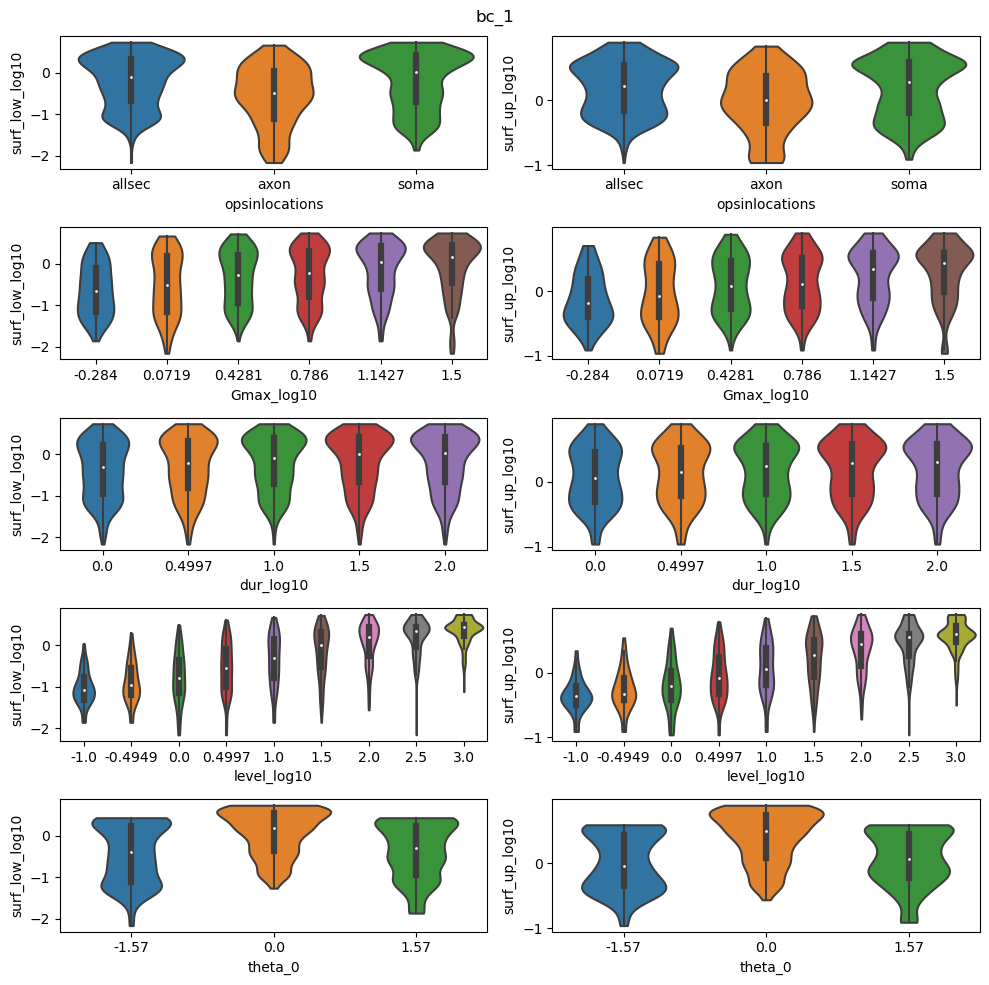

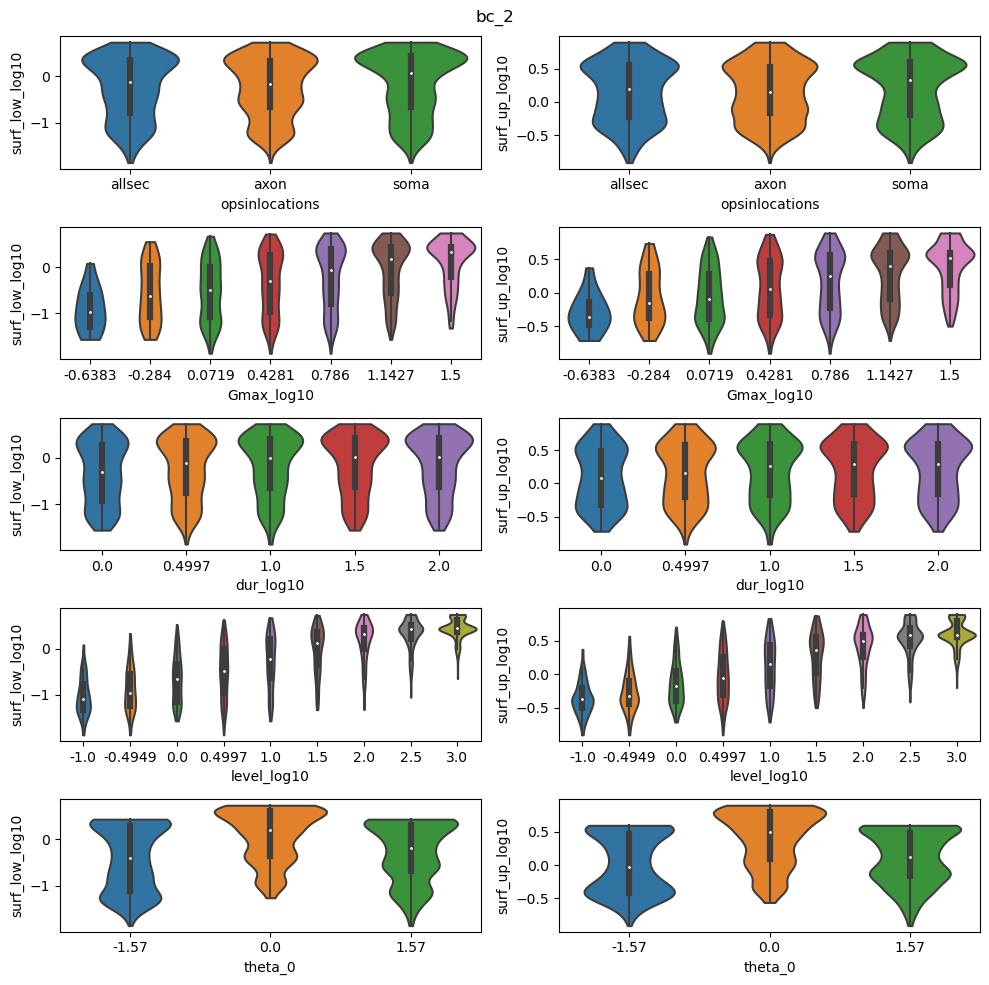

In [7]:
level = 100
fig,axs = plt.subplots(6,2,tight_layout = True,figsize=(10,10))
for i,pool in enumerate(['neurontemplate','opsinlocations','Gmax','dur','level_log10','theta_0']):
    for j,feat in enumerate(['surf_low_log10','surf_up_log10']):
        idx = ~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))
        sns.violinplot(data=vta_df[idx],y=feat,x=pool,ax=axs[i,j],cut=0)

for nt in unique_values_columns_vta['neurontemplate']:
    idx_nt = vta_df['neurontemplate']==nt
    fig,axs = plt.subplots(5,2,tight_layout = True,figsize=(10,10))
    for i,pool in enumerate(['opsinlocations','Gmax_log10','dur_log10','level_log10','theta_0']):
        for j,feat in enumerate(['surf_low_log10','surf_up_log10']):
            idx = ~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat])) & idx_nt
            sns.violinplot(data=vta_df[idx],y=feat,x=pool,ax=axs[i,j],cut=0)
    fig.suptitle(nt)


{'surf_low_log10': {'all': {'neurontemplate': (55.963131770730705, 4.277733478730961e-12), 'opsinlocations': (17.73623759366426, 0.000498521283526514), 'Gmax': (1636.1771480668124, 0.0), 'dur': (111.85637018934042, 2.9243218482553467e-23), 'theta_0': (1349.036796618866, 1.1491630994349339e-293), 'level': (4416.685052194854, 0.0)}}, 'surf_up_log10': {'all': {'neurontemplate': (44.71176826478758, 1.0654188620125285e-09), 'opsinlocations': (15.466417016406611, 0.0014584854983477112), 'Gmax': (1604.514709189614, 0.0), 'dur': (106.48726163803774, 4.0825704737769117e-22), 'theta_0': (1686.490606358696, 0.0), 'level': (4221.645170586644, 0.0)}}}


Text(0.5, 1.0, 'Kruskal Wallis')

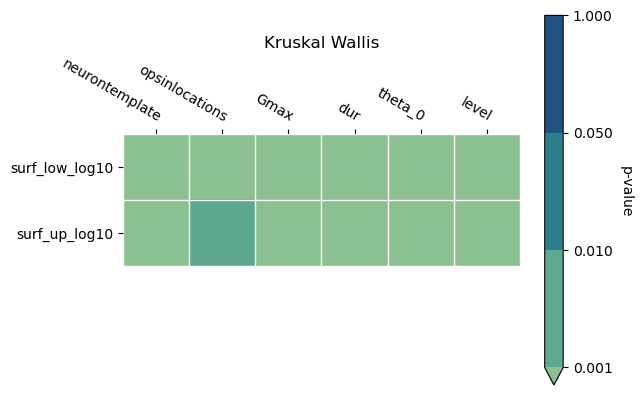

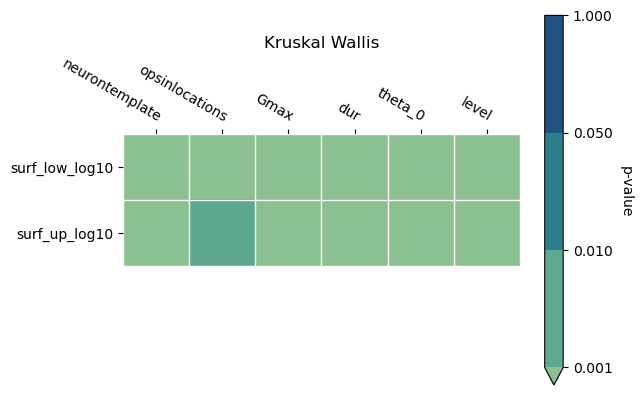

In [21]:
#colors = np.array([[189,0,38],[166,217,106],[102,189,99],[26,152,80]])/256
#colors = np.flipud(colors)
#hcolors = ['06492F','1F734E','3FA070','64CF94','8FFEBB','fdae61']
#hcolors = hcolors[1:-2]+hcolors[-1:]
#colors = np.array([tuple(int(h[i:i+2], 16) for i in (0, 2, 4)) for h in hcolors])/256
# counts = len(hcolors)*[100]
#fig, ax = plt.subplots()
# ax.bar(hcolors, counts, color=colors)
colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0,2,5,8],:]
cmap = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries  = [0.001,0.01,0.05,1.0]
boundnorm = cm.colors.BoundaryNorm(boundaries,len(boundaries),extend='min')




KW_dict = {}
features = ['surf_low_log10','surf_up_log10']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
for feat in features:
    KW_dict[feat] = {'all':{}}
    for pool in classes:
        intm_df=vta_df[~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))]
        pooledData = [list(intm_df[feat][intm_df[pool]==ukey]) for ukey in unique_values_columns_vta[pool]]
        KW_dict[feat]['all'][pool] = stats.kruskal(*pooledData,nan_policy='omit')[:]
print(KW_dict)

heatmapdata = np.zeros((len(features),len(classes)))
for ifeat,feat in enumerate(features):
    for ipool,pool in enumerate(classes):
        heatmapdata[ifeat,ipool] = KW_dict[feat]['all'][pool][1]

fig,ax= plt.subplots(1,1)
heatmap(heatmapdata,features,classes,ax=ax,norm=boundnorm,cmap=cmap,cbarlabel='p-value')
ax.set_title('Kruskal Wallis')

## Limite surf
KW_dict = {}
for feat in features:
    KW_dict[feat] = {'all':{}}
    for pool in classes:
        intm_df=vta_limit_df[~(np.isinf(vta_df[feat])|np.isnan(vta_df[feat]))]
        pooledData = [list(intm_df[feat][intm_df[pool]==ukey]) for ukey in unique_values_columns_vta[pool]]
        KW_dict[feat]['all'][pool] = stats.kruskal(*pooledData,nan_policy='omit')[:]

heatmapdata = np.zeros((len(features),len(classes)))
for ifeat,feat in enumerate(features):
    for ipool,pool in enumerate(classes):
        heatmapdata[ifeat,ipool] = KW_dict[feat]['all'][pool][1]

fig,ax= plt.subplots(1,1)
heatmap(heatmapdata,features,classes,ax=ax,norm=boundnorm,cmap=cmap,cbarlabel='p-value')
ax.set_title('Kruskal Wallis')

Text(0.5, 0.98, 'column greater than row')

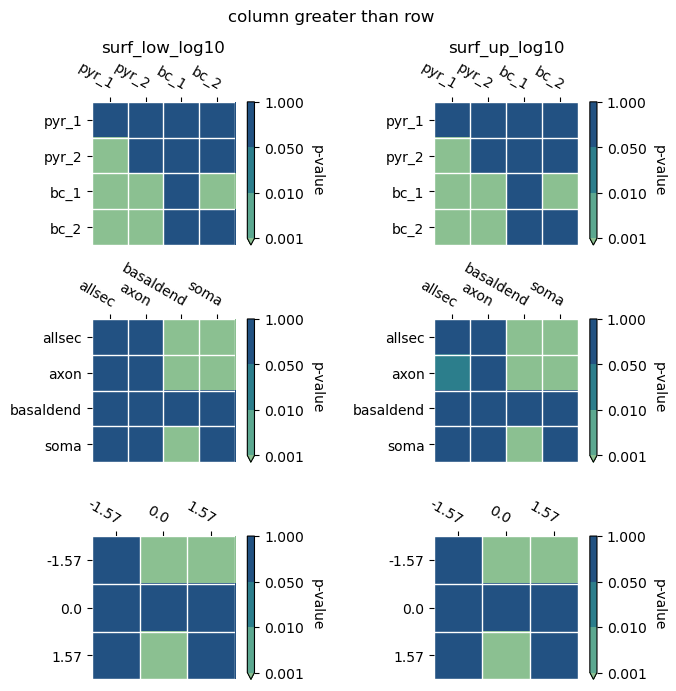

In [26]:
WSRT_dict = {}
classes_toplot = ['neurontemplate','opsinlocations','theta_0']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
for feat in features:
    WSRT_dict[feat] = {'all':{}}
    for pool in classes_toplot:
        ukeys =  unique_values_columns_vta[pool]
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):

                df1 = vta_df[vta_df[pool]==ukeys[i]]
                df2 = vta_df[vta_df[pool]==ukeys[j]]
                df1 = df1.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                df2 = df2.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_1']-diff_df[feat+'_0']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='greater')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat]['all'][pool] = mytest_WSRT

fig,axs = plt.subplots(len(classes_toplot),2,tight_layout=True,figsize=(7,7))
for pool,ax in zip(classes_toplot,axs):
    ukeys =  unique_values_columns_vta[pool]
    for ifeat,feat in enumerate(features):
        im,_ = heatmap(WSRT_dict[feat]['all'][pool][:,:,1], ukeys, ukeys, ax=ax[ifeat], norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
fig.suptitle('column greater than row')

## Limited surf to axial symm simulation domain

Text(0.5, 0.98, 'column greater than row')

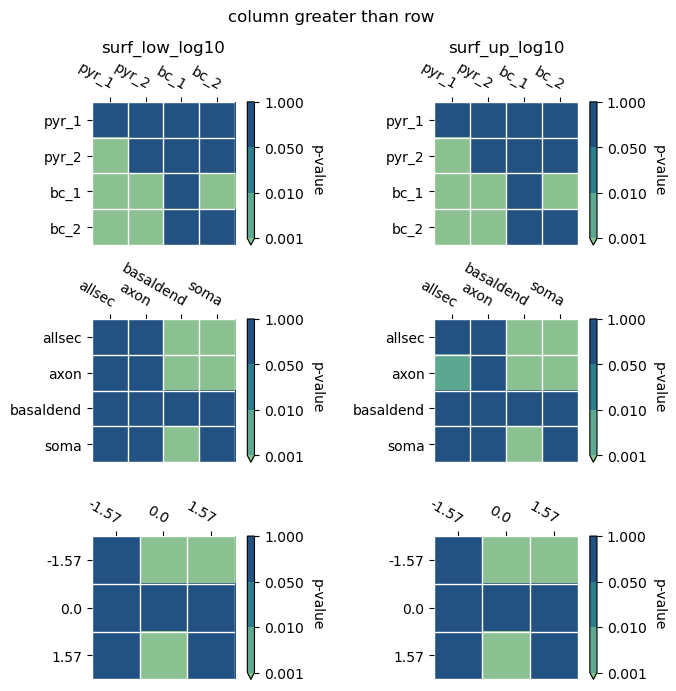

In [25]:
WSRT_dict = {}
classes_toplot = ['neurontemplate','opsinlocations','theta_0']
classes = ['neurontemplate','opsinlocations','Gmax','dur','theta_0','level']
for feat in features:
    WSRT_dict[feat] = {'all':{}}
    for pool in classes_toplot:
        ukeys =  unique_values_columns_vta[pool]
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):

                df1 = vta_limit_df[vta_limit_df[pool]==ukeys[i]]
                df2 = vta_limit_df[vta_limit_df[pool]==ukeys[j]]
                df1 = df1.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                df2 = df2.set_index([x for x in classes if not (pool in x or x in pool)])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_1']-diff_df[feat+'_0']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='greater')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat]['all'][pool] = mytest_WSRT

fig,axs = plt.subplots(len(classes_toplot),2,tight_layout=True,figsize=(7,7))
for pool,ax in zip(classes_toplot,axs):
    ukeys =  unique_values_columns_vta[pool]
    for ifeat,feat in enumerate(features):
        im,_ = heatmap(WSRT_dict[feat]['all'][pool][:,:,1], ukeys, ukeys, ax=ax[ifeat], norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
fig.suptitle('column greater than row')

In [23]:
print(vta_df['surf_low_log10'].max(),vta_limit_df['surf_low_log10'].max())


0.7404 0.4393


['allsec1_-2' 'allsec1_0' 'allsec1_2' 'axon1_-2' 'axon1_0' 'axon1_2'
 'basaldend1_-2' 'basaldend1_0' 'basaldend1_2' 'soma1_-2' 'soma1_0'
 'soma1_2' 'allsec2_-2' 'allsec2_0' 'allsec2_2' 'axon2_-2' 'axon2_0'
 'axon2_2' 'basaldend2_-2' 'basaldend2_0' 'basaldend2_2' 'soma2_-2'
 'soma2_0' 'soma2_2']


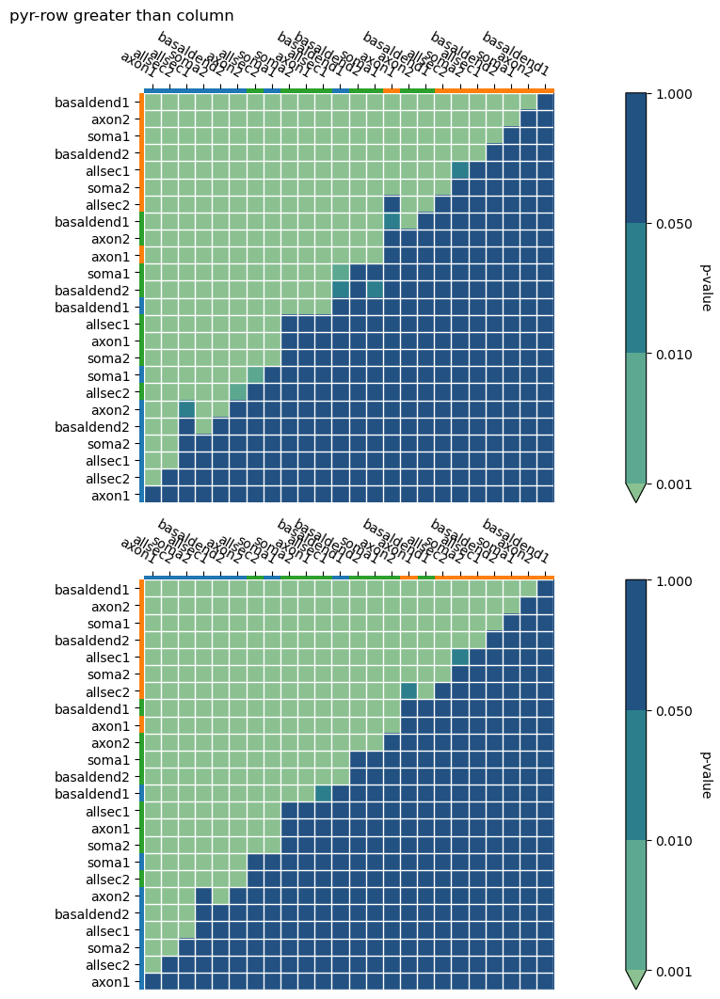

In [24]:
# limit surface is used to equalize comparison between pitch 0 and pitch +- pi/2
colors = np.array(sns.color_palette("crest", n_colors=10))
colors = colors[[0,2,5,8],:]
cmap = LinearSegmentedColormap.from_list('my_cmap', colors, N=colors.shape[0])
boundaries  = [0.001,0.01,0.05,1.0]
boundnorm = cm.colors.BoundaryNorm(boundaries,len(boundaries),extend='min')
features = ['surf_low_log10','surf_up_log10']
classes = ['opsinlocations','Gmax','dur','theta_0','level','celltype','number']
wsrt_df = vta_limit_df[features+classes].copy()
wsrt_df['wsrt_keys'] = wsrt_df.apply(lambda x: f"{x['opsinlocations']}{x['number']}_{x['theta_0']:0.0f}",axis=1)
print(wsrt_df['wsrt_keys'].unique())


ukeys =  wsrt_df['wsrt_keys'].unique()
for cellt in wsrt_df['celltype'].unique()[:1]:
    intm_df = wsrt_df[wsrt_df['celltype']==cellt]
    for feat in features:
        WSRT_dict[feat][cellt] = {}
        mytest_WSRT = np.ones((len(ukeys),len(ukeys),2))
        for i in range(len(ukeys)):
            for j in range(len(ukeys)):
                df1 = intm_df[intm_df['wsrt_keys']==ukeys[i]]
                df2 = intm_df[intm_df['wsrt_keys']==ukeys[j]]
                df1 = df1.set_index([x for x in ['Gmax','dur','level']])[feat]
                df2 = df2.set_index([x for x in ['Gmax','dur','level']])[feat]
                diff_df = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=('_0', '_1'),validate='one_to_many')
                diff_df = diff_df[feat+'_0']-diff_df[feat+'_1']
                xydiff = np.array(diff_df)
                xydiff = xydiff[~(np.isnan(xydiff)|np.isinf(xydiff))]
                if  len(xydiff)>0 and i!=j:
                    wstats = stats.wilcoxon(xydiff,alternative='greater')
                    mytest_WSRT[i,j,0] = wstats[0]
                    mytest_WSRT[i,j,1] = wstats[1]
        WSRT_dict[feat][cellt] = mytest_WSRT


row_colors = sns.color_palette("tab10")
row_colors_dict = {ol:clr for ol,clr in zip(wsrt_df['theta_0'].unique(),row_colors)}
# row_colors = np.tile(np.array([[1,0,0,0.99],[0,1,0,0.99]]),(int(len(ukeys)/2),1))[:,None,:]
for cellt in wsrt_df['celltype'].unique()[:1]:
    fig,axs = plt.subplots(2,1,tight_layout=True,figsize=(13*1.2,9*1.2))
    for ifeat, (feat, ax) in enumerate(zip(features,axs)):
        greatest = np.sum(WSRT_dict[feat][cellt][:,:,1]<0.001,axis=1)
        idx_column = np.argsort(greatest)
        idx_row = np.flip(idx_column)
        row_labels = ukeys[idx_row]
        column_labels = ukeys[idx_column]
        row_colors = np.array([i for x in row_labels for k,i in row_colors_dict.items() if f'_{k:0.0f}' in x])[:,None,:]
        column_colors = np.array([i for x in column_labels for k,i in row_colors_dict.items() if f'_{k:0.0f}' in x])[None,:,:]
        row_labels = [x.rsplit('_',1)[0] for x in row_labels]
        column_labels = [x.rsplit('_',1)[0] for x in column_labels]

        data_toplot = WSRT_dict[feat][cellt][:,idx_column,1]
        im,_ = heatmap2(data_toplot[idx_row,:], row_labels, column_labels, ax=ax, row_colors=row_colors, column_colors=column_colors, norm=boundnorm,cmap=cmap,cbarlabel='p-value')
        if pool==classes[0]:
            ax[ifeat].set_title(feat)
    fig.suptitle(f'{cellt}-row greater than column')


In [29]:

classes = ['neurontemplate','opsinlocations','Gmax','dur','level']
idxs = []
for t0 in unique_values_columns_vta['theta_0']:
    idxs.append(vta_df['theta_0']==t0)

df1 = vta_limit_df[idxs[0]].set_index([x for x in classes])
df2 = vta_limit_df[idxs[1]].set_index([x for x in classes])
dfs = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=(f"_{unique_values_columns_vta['theta_0'][0]}", f"_{unique_values_columns_vta['theta_0'][1]}"),validate='one_to_one')
df3 = vta_limit_df[idxs[2]].set_index([x for x in classes])
dfs = pd.merge(dfs, df3.add_suffix(f"_{unique_values_columns_vta['theta_0'][2]}"), left_index=True, right_index = True,validate='one_to_one')
print(dfs.columns,unique_values_columns_vta['theta_0'][2])
dfs = dfs.reset_index()

idxs = []
dfs[['celltype','number']] = dfs['neurontemplate'].str.split('_',expand=True)
for n in dfs['number'].unique():
    idxs.append(dfs['number']==n)
    print()
classes.append('celltype')
print(classes)
df1 = dfs[idxs[0]].set_index([x for x in classes if  not x == 'neurontemplate'])
df2 = dfs[idxs[1]].set_index([x for x in classes if not x == 'neurontemplate'])
dfs2 = pd.merge(df1, df2, left_index=True, right_index = True, suffixes=(f"_1", f"_2"),validate='one_to_one')
dfs2 = dfs2.reset_index()


Index(['vta_low_-1.57', 'vta_up_-1.57', 'surf_low_-1.57', 'surf_up_-1.57',
       'b_opt_pos_-1.57', 'b_opt_pos_TAC_-1.57', 'w_opt_pos_TAC_-1.57',
       'distribution_-1.57', 'opsinmech_-1.57', 'distribution_method_-1.57',
       ...
       'settings_str_1.57', 'vta_low_log10_1.57', 'vta_up_log10_1.57',
       'surf_low_log10_1.57', 'surf_up_log10_1.57', 'dur_log10_1.57',
       'Gmax_log10_1.57', 'level_log10_1.57', 'celltype_1.57', 'number_1.57'],
      dtype='object', length=102) 1.57


['neurontemplate', 'opsinlocations', 'Gmax', 'dur', 'level', 'celltype']


['surf_low_-1.57', 'surf_low_0.0', 'surf_low_1.57']


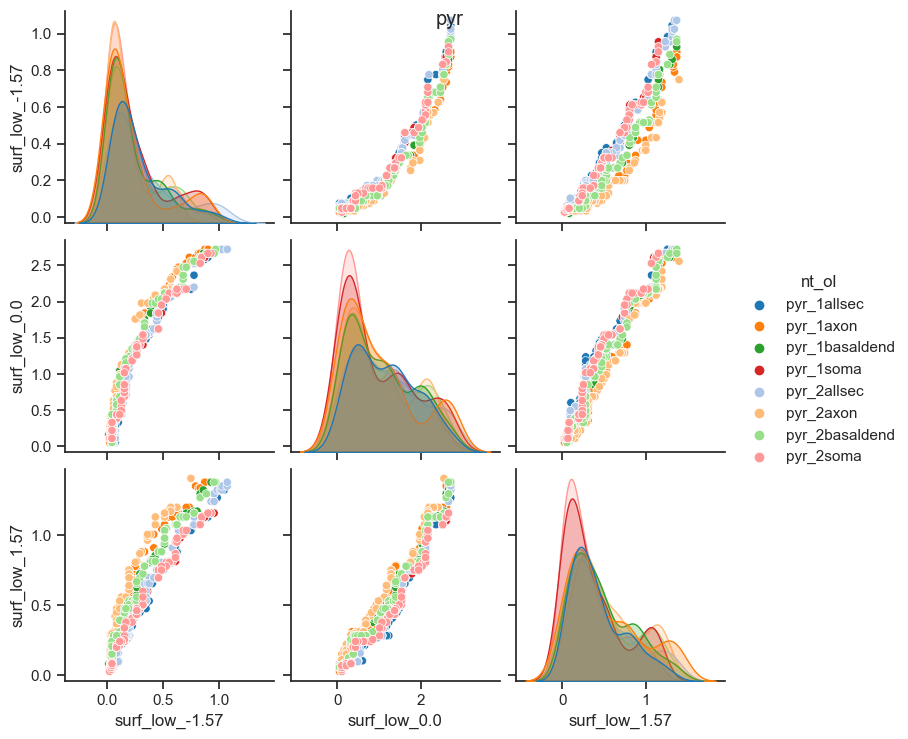

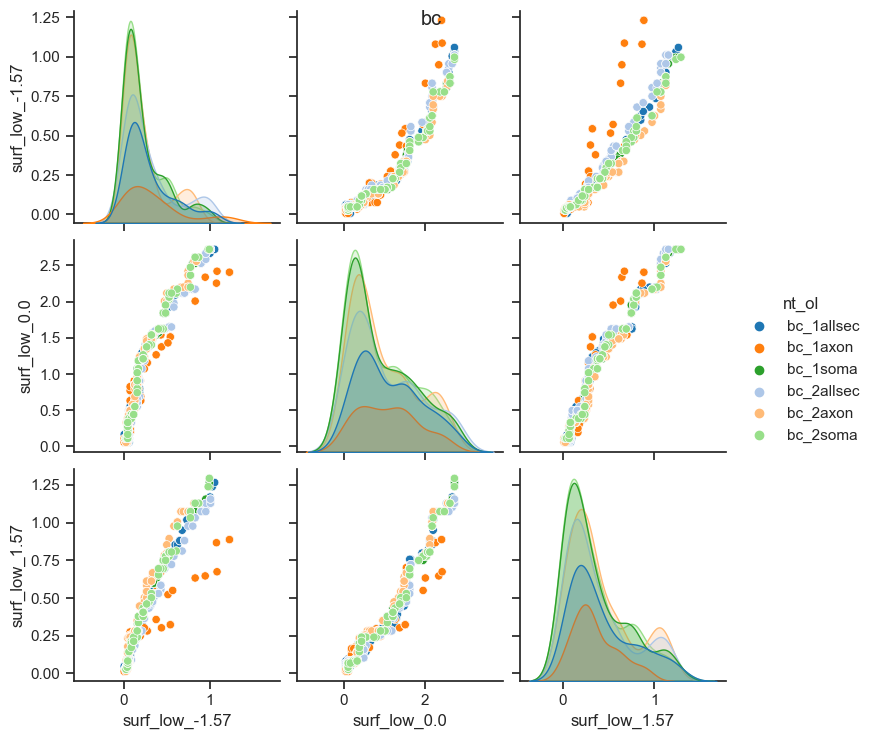

In [30]:
sns.set_theme(style="ticks")
vars = [x for x in dfs.columns if 'surf_low' in x and not 'log10' in x]
print(vars)
for x in ['pyr','bc']:
    dfs_intm = dfs[dfs['neurontemplate'].str.contains(x)].copy()
    dfs_intm['nt_ol'] = dfs_intm['neurontemplate'] + dfs_intm['opsinlocations']
    idx = np.ones(len(dfs_intm))
    for v in vars:
        idx = idx & (dfs_intm[v]>0) & (dfs_intm[v]<dfs[v].max())
    palette=np.array(sns.color_palette("tab20",n_colors=len(dfs_intm['nt_ol'].unique())))
    palette = np.vstack((palette[0::2,:],palette[1::2,:]))
    palette = dict(zip(dfs_intm['nt_ol'].unique(), palette))
    # print(palette)
    sns.pairplot(dfs_intm[idx], hue="nt_ol",vars=vars,palette=palette)
    fig = plt.gcf()
    fig.suptitle(x)

['surf_low_-1.57_1', 'surf_low_0.0_1', 'surf_low_1.57_1', 'surf_low_-1.57_2', 'surf_low_0.0_2', 'surf_low_1.57_2']


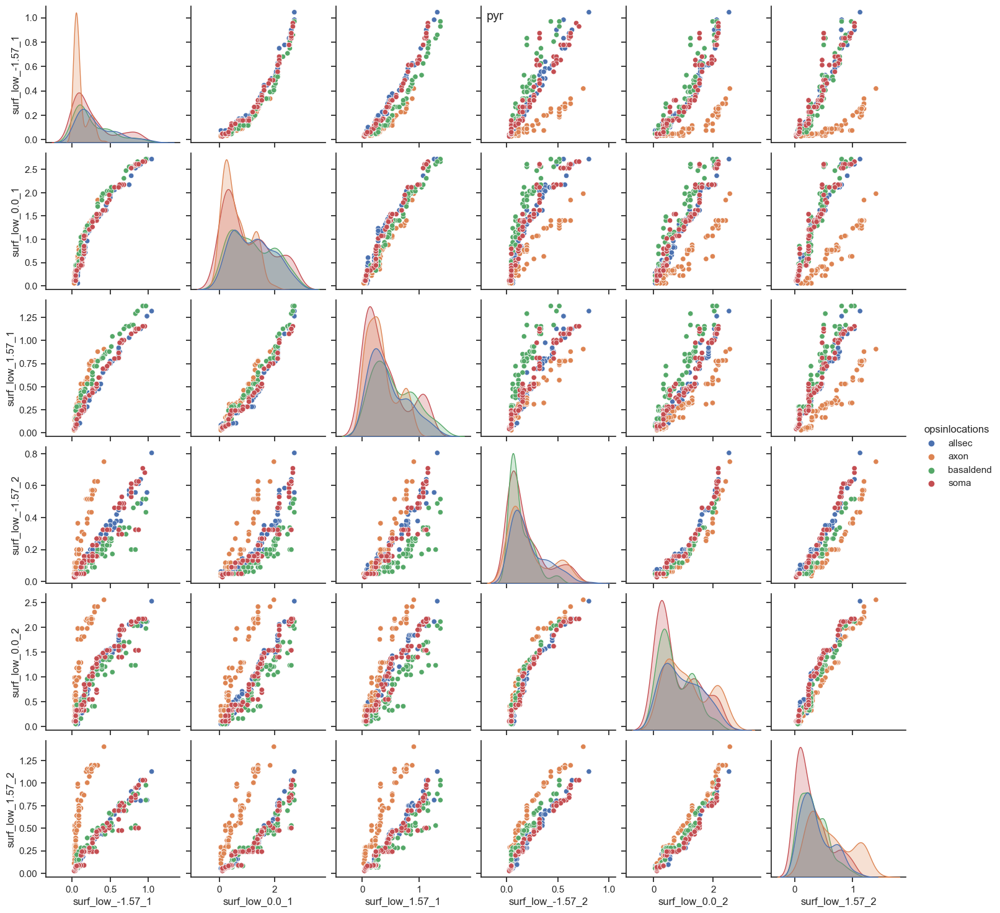

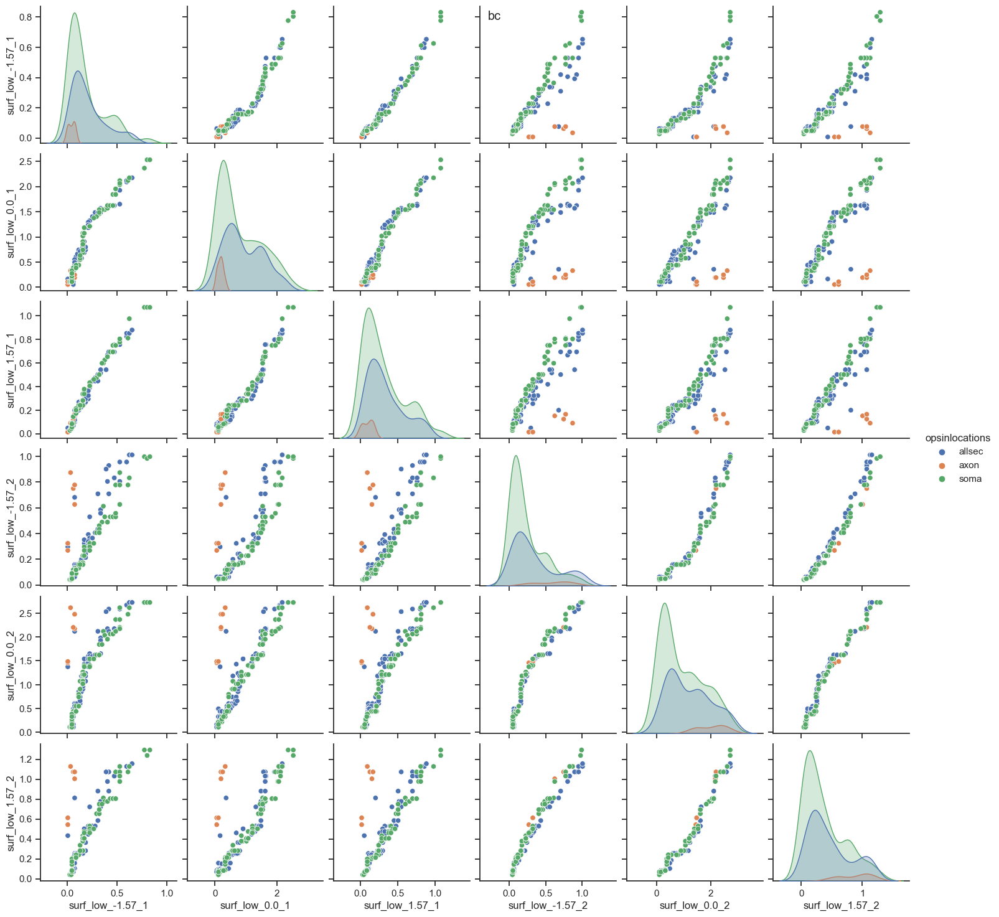

In [31]:
vars = [x for x in dfs2.columns if 'surf_low' in x and not 'log10' in x]
print(vars)

for x in ['pyr','bc']:
    dfs_intm = dfs2[dfs2['celltype'].str.contains(x)].copy()
    idx = np.ones(len(dfs_intm))
    for v in vars:
         idx = idx & (dfs_intm[v]>0) & (dfs_intm[v]<dfs2[v].max())
    sns.pairplot(dfs_intm[idx], hue="opsinlocations",vars=vars)
    fig = plt.gcf()
    fig.suptitle(x)

In [19]:
def linearReg(dataframe,features,axs,filteronthreshold,xdata_str='Gmax_log10',plot_flag = True,scatterplot=True):
    ress = []
    tinv = lambda p, df: abs(stats.t.ppf(p/2, df))
    for feat,ax in zip(features,axs):
        xdata = np.array(dataframe[xdata_str])
        ydata = np.array(dataframe[feat])
        idx = ~np.isnan(ydata)
        if filteronthreshold:
            idx = ~(np.isnan(np.array(dataframe['surf_low_log10']))|np.isinf(np.array(dataframe['surf_low_log10'])))& idx
        xdata = xdata[idx]
        xvals = np.unique(xdata)
        ydata = ydata[idx]
        res = stats.linregress(xdata, ydata)
        ts = tinv(0.05, len(xdata)-2)
        print(f"\n{feat}\nRsquared: {res.rvalue**2}\nslope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f}")
        print(f"intercept (95%): {res.intercept:.6f} +/- {ts*res.intercept_stderr:.6f}")


        # calculate MSE
        yestim = xdata*res.slope+res.intercept
        MSE = np.mean((ydata-yestim)**2)

        # calculate own estimate 95% confidence interval
        mymatrix = np.zeros((4,len(xvals)))
        i= -1
        for x in [-1,1]:
            for y in [-1,1]:
                i+=1
                mymatrix[i,:] = xvals*(res.slope+x*ts*res.stderr)+res.intercept+y*ts*res.intercept_stderr
        minslope = np.min(mymatrix,axis=0)
        maxslope = np.max(mymatrix,axis=0)

        #plot

        intm_df = dataframe[idx]
        if plot_flag:
            if scatterplot:
                sns.scatterplot(intm_df,x = xdata_str,y=feat,ax=ax,hue='opsinlocations',style='theta_0')
                sns.regplot(intm_df,x = xdata_str, y=feat,ax=ax,marker='')
            else:
                sns.regplot(intm_df,x = xdata_str, y=feat,ax=ax)
            ax.plot(xvals,xvals*res.slope+res.intercept)
            ax.plot(xvals,minslope,color='k')
            ax.plot(xvals,maxslope,color='k')
            ax.set_title(feat)
        res = res._asdict()
        res['MSE'] = MSE
        res['Rsquared'] = res['rvalue']**2
        ress.append(res)
    return ress


surf_low_log10
Rsquared: 0.4683736048723046
slope (95%): 0.488292 +/- 0.028560
intercept (95%): -0.103427 +/- 0.025076

surf_up_log10
Rsquared: 0.4651239759218274
slope (95%): 0.347193 +/- 0.020440
intercept (95%): 0.229111 +/- 0.017947


 CA1_PC_cAC_sig5

surf_low_log10
Rsquared: 0.6169220283312198
slope (95%): 0.571529 +/- 0.042688
intercept (95%): -0.065937 +/- 0.035856

surf_up_log10
Rsquared: 0.6091580279783493
slope (95%): 0.399906 +/- 0.030362
intercept (95%): 0.260141 +/- 0.025503


 CA1_PC_cAC_sig6

surf_low_log10
Rsquared: 0.6067215435605263
slope (95%): 0.525803 +/- 0.041301
intercept (95%): -0.042130 +/- 0.034693

surf_up_log10
Rsquared: 0.5907041382703068
slope (95%): 0.373864 +/- 0.030362
intercept (95%): 0.271489 +/- 0.025504


 cNACnoljp1

surf_low_log10
Rsquared: 0.14211748523028073
slope (95%): 0.350434 +/- 0.121916
intercept (95%): -0.234077 +/- 0.121480

surf_up_log10
Rsquared: 0.1682857933620235
slope (95%): 0.264796 +/- 0.083357
intercept (95%): 0.131920 +/- 0.08

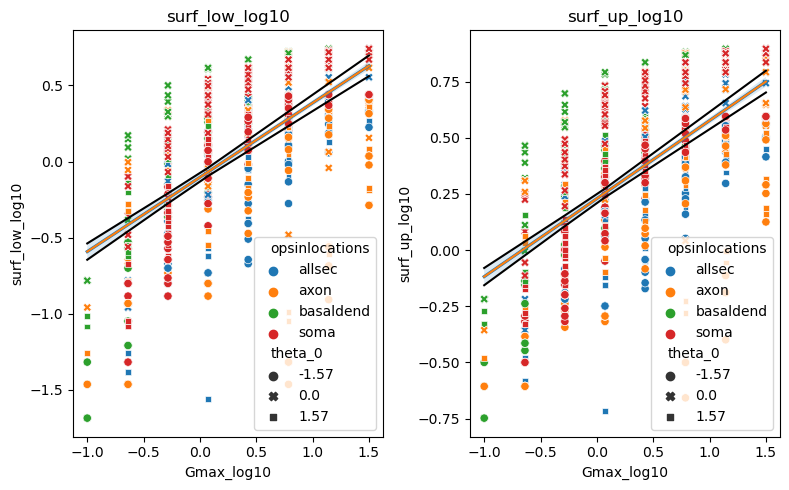

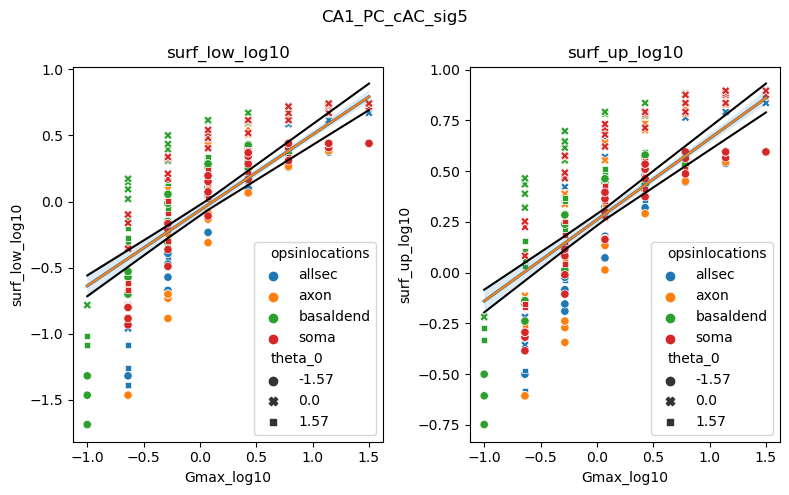

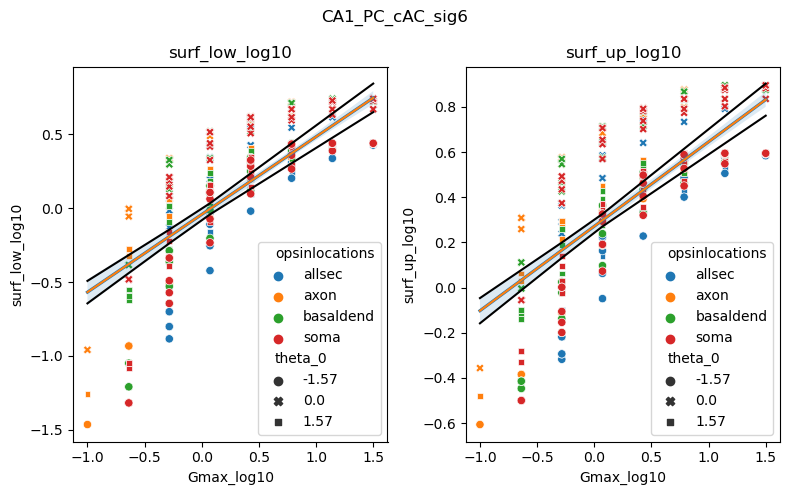

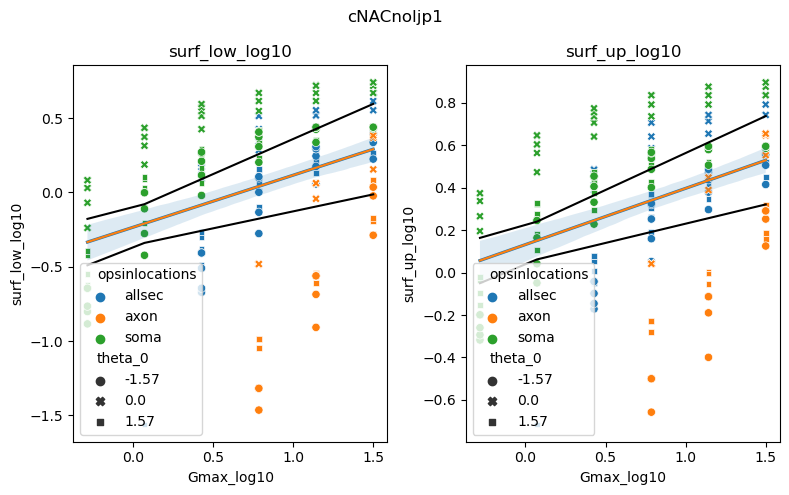

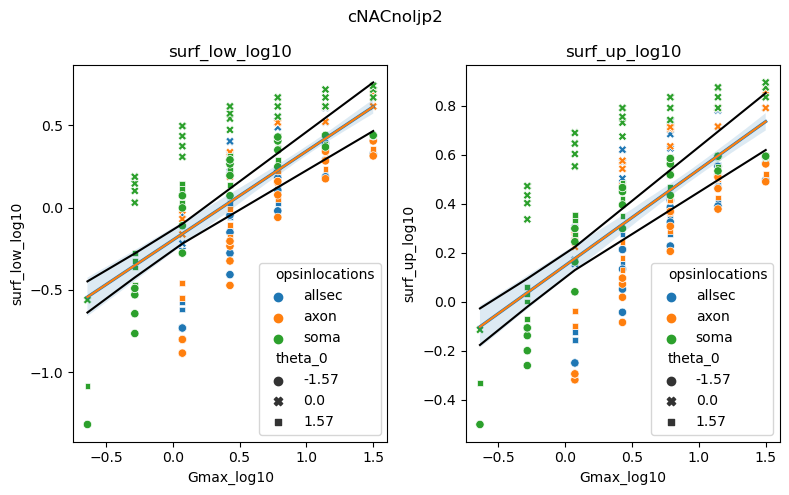

In [20]:
ress_dict = {'surf_low_log10':{},'surf_up_log10':{}}
fig,axs = plt.subplots(1,2,tight_layout = True,figsize=(8,5))
filteronthreshold = True
ress = linearReg(vta_df[vta_df['level']==100],['surf_low_log10','surf_up_log10'],axs,filteronthreshold)
ress_dict['surf_low_log10']['all'] = ress[0]
ress_dict['surf_up_log10']['all'] = ress[1]
for cell in unique_values_columns_vta['neurontemplate']:
    intm_df = vta_df[(vta_df['neurontemplate']==cell) & (vta_df['level']==100)]
    fig,axs = plt.subplots(1,2,tight_layout = True,figsize=(8,5))
    print('\n\n',cell)
    ress = linearReg(intm_df,['surf_low_log10','surf_up_log10'],axs,filteronthreshold)
    fig.suptitle(cell)
    ress_dict['surf_low_log10'][cell] = ress[0]
    ress_dict['surf_up_log10'][cell] = ress[1]